# <ins>TASK 2: Understanding Customer Demographics</ins>
*Report writen by Arturo Sirvent Fresneda (cohort DS04, mentor Felice)*  
**31 JULY**

**................................................................................................................................................................................**
# <ins>Index</ins>

#### Introduction
#### Data dictionary
#### QUESTIONS to answer
#### Code

#### QUESTIONS answered

#### Final conclusions

#### Appendix
**................................................................................................................................................................................**


# <ins>1-Introduction</ins>

After handing the first report about the EDA on the Demographic Data, Danielle Sherman,  
the Chief Technology Officer at Blackwell Electronics (our boss), has thanked us for the work,  
and has asked for the second part of the analysis, build a model and get a deeper understanding  
from the data. Specifically he has commented some ideas from  Martin Goodrich, the VP of Sales, and  
some questions that Daniel has (these and more are summed up in the **Questions to answer** part in this report).

Summarizing, we have to:
* Investigate more in depth some relations we saw in the EDA.
* Build ML algorithms for making predictions and getting a better understanding on the data.
    1. Test the models with different metrics.
    * Explore the hyperparameters space searching for the best performance.
    * Evaluate the models to be sure that the final choice is the best and most reliable model found so far. 
    

# <ins>2-Data Dictionary</ins>

We have explained this in task 1, however, since we are using the same data, lets review the data struture of out dataset.

The data from our dataset has 5 variables, one in each column, and 80000 rows.  
Some are numerical but other categories with a number assigned to it.

**In-store**  
    0: Online  
    1: In the store  

**Age**  
    Numerical value of the age of the person who made the purchase (integer).  
    
**Items**  
    Numerical value of the number of items purchased by a person. (integer)  
    
**Amount**  
    Numerical value of the price paid in a purchase. (float)  
    
**Region**  
    Categorical reference to the region in which the purchase was made.  
    
    1: North
    2: South 
    3: East 
    4: West 
    

# <ins>3-QUESTIONS to answer</ins>

Below are the questions that arise from the e-mail Daniel sent us. Our aim is to answer them in this report.

#### From the e-mail: 
Directly extacted from the e-mail:  

* *... Martin Goodrich thinks that **customers who shop in the store are older than customers who shop online** and that **older people spend more money on electronics than younger people**...changes to the website to attract older buyers.*
  
  
* ... *gain insight into any **factors that can better understand the age of our customers** and if **it correlates with how much they spend**...*
  
  
* Infer any insights about customer purchasing behavior:
    * *Are there **differences in the age of customers between regions?** If so, can we predict the age of a customer in a region based on other demographic data?*
    * *We need to investigate Martin’s hypothesis: Is there any **correlation between age of a customer and if the transaction was made online or in the store**? Do any **other factors predict if a customer will buy online or in our stores?** *
      
      
* TO DO: *I’d like you to use machine learning to build a predictive model that can help us in our search.* And * create a brief report of your findings and conclusions and an explanation of how you arrived at those conclusions... *
    
#### From the POA  
Our work is to answer to Daniel's questions, and the POA from Task 2 gives us some more information about how to do it.
* Discretize Age and use it as the dependent variable; experiment with different numbers of bins.
* Discretize Amount and use it as the dependent variable. Can a useful model be constructed?
* Use two additional classification algorithms from Sci-Kit Learn: 
    * RandomForestClassifier
    * GradientBoostingClassifier
Other questions:
* What about items? Are these even in the tree? Why or why not?
* What about classifying Where a transaction took place -can that be done successfully?
* Tune the parameters of the models (maxdepth etc...).
(It is mentioned that ideally you should be able to achieve an accuracy of higher than 75%)  
 

# <ins>4- CODE</ins>


In [3]:
#import all the required libraries
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd 
import plotly.express as px

from matplotlib.lines import Line2D

from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor, plot_tree,export_text

### Recap about the EDA relative to the ages 
In the EDA from Task 1, we talked about the ages relative to the regions, and to the channel of purchase (online or in-store).

Before building any model, lets try to gain perspective about the claims that Martin Goodrich did:

1. **Customers who shop in the store are older than customers who shop online.**
2. **Older people spend more money on electronics than younger people.**


Also we would like, before starting the feature selection, to have an idea about:
1. **Factors that can give better understanding on the age of our customers.**
2. **and if it correlates with how much they spend.**

*(I don't forget about the other questions like: Correlation between age of a customer and if the transaction was made online or in-store. But lets go a step at a time)*


In [4]:
#Load data
data = pd.read_csv("Demographic_Data.csv")

In [5]:
#perform the data cleaning

#CAUTION!!!!
#Data cleaning it's a whole process itself, with many steps and reasoning,
#here we do it that simple, because we have studied that PARTICULAR case in task 1. 
#Therefore we know that the only required operation for now, will be dealing with some 
#duplicated columns (21 in total).
data = data.drop_duplicates()

#this line below is for reseting the row numeration, from 0 to ...end
#because when dorping some duplicates the index numbers where no consecutive. Example: 1,2,4,5,7...end
data=data.reset_index(drop=True)
colname=data.columns
data

,in-store,age,items,amount,region
0,0,37,4,281.03,2
1,0,35,2,219.51,2
2,1,45,3,1525.70,4
3,1,46,3,715.25,3
4,1,33,4,1937.50,1
...,...,...,...,...,...
79974,1,71,3,558.82,1
79975,0,59,7,1932.00,3
79976,0,54,1,414.16,2
79977,1,49,4,335.32,1


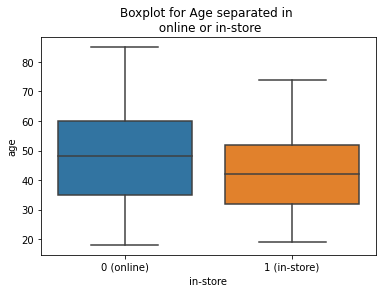

In [6]:
#Customers who shop in-store are older than customers who shop online?
#for anwering this, we will use boxplots

plt.figure()
sns.boxplot(x=colname[0],y=colname[1], data=data)

plt.xticks([0,1],["0 (online)","1 (in-store)"])
plt.title("Boxplot for Age separated in \n online or in-store");

This is for the four regions together, lets plot for each region, to see it it changes from region to region.

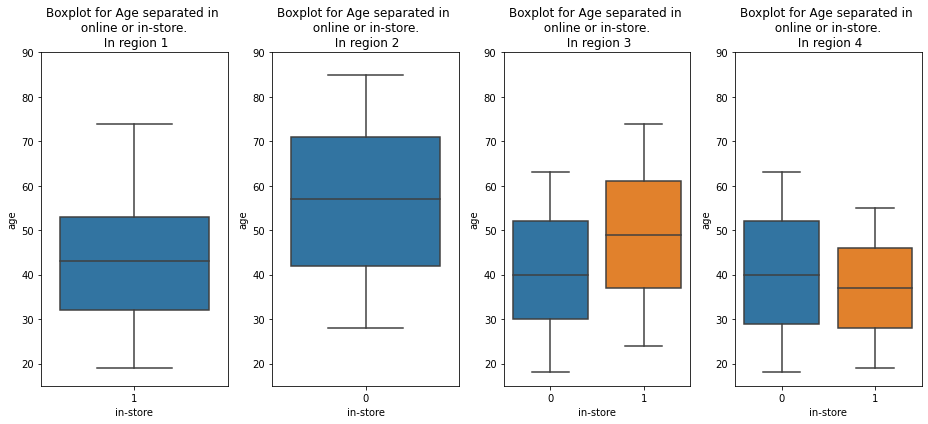

In [7]:
plt.figure(figsize=(13,6))
for i in [1,2,3,4]:
    plt.subplot(1,4,i)
    sns.boxplot(x="in-store",y="age",data=data.loc[data["region"]==i,["age","in-store"]])
    plt.ylim([15,90])
    plt.title(f"Boxplot for Age separated in \n online or in-store. \n In region {i}");
plt.tight_layout()

From the last boxplots, and recalling that we are working with a sample of data, and that could not extrapolate correctly to the population, we see how only in region 3 the purchases in-store are made by older people than online. In the four regions together the average age is greater for the purchases online and not the ones in-store.  
**However**, that doesn't mean that that older people spend more money than younger ones, it mean that they made more purchases.

Because boxplot only tells us about sample-distribution, we need a comparison between the real amount of counts in each region, separated in each case of online and in-store.
This is what I show in the next pie chart.

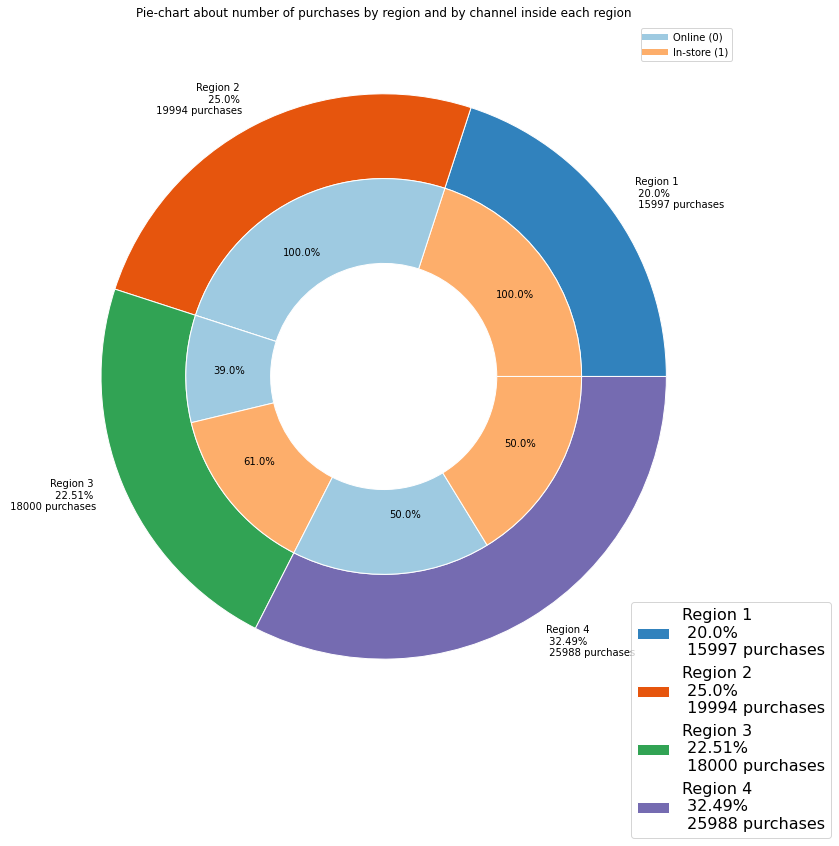

In [8]:
#we aim to create a 2 level pie chart

fig, ax = plt.subplots(figsize=(13,13))

size = 0.3
#here I get the number of purchases in each region, online and in-store
vals = np.array([data.loc[data["region"]==1,"in-store"].value_counts().reindex(data["in-store"].unique(),
                                                                               fill_value=0).values,
                data.loc[data["region"]==2,"in-store"].value_counts().reindex(data["in-store"].unique(), 
                                                                               fill_value=0).values,
                data.loc[data["region"]==3,"in-store"].value_counts().reindex(data["in-store"].unique(), 
                                                                              fill_value=0).values,
                data.loc[data["region"]==4,"in-store"].value_counts().reindex(data["in-store"].unique(),
                                                                              fill_value=0).values])
#for the percentages in the iner circle
sum_aux=np.sum(vals,axis=1)
prob_aux=np.array([[round(vals[i][0]/sum_aux[i],2),round(vals[i][1]/sum_aux[i],2)] for i in range(4)] )
prob_aux=prob_aux.flatten()
prob_aux=["" if(i==0) else str(i*100)+"%"  for i in prob_aux]

#percentages in the outer circle
total_aux=vals.sum(axis=None)
sum_aux_2=vals.sum(axis=-1)
prob_aux_out=[round(100*i/total_aux,2) for i in sum_aux_2]

#indices for the labels
index_labels=np.array([data.loc[data["region"]==1,"in-store"].value_counts().reindex(data["in-store"].unique(),
                                                                                     fill_value=0).index.values, 
                       data.loc[data["region"]==2,"in-store"].value_counts().reindex(data["in-store"].unique(),
                                                                                     fill_value=0).index.values,
                       data.loc[data["region"]==3,"in-store"].value_counts().reindex(data["in-store"].unique(),
                                                                                     fill_value=0).index.values,
                       data.loc[data["region"]==4,"in-store"].value_counts().reindex(data["in-store"].unique(),
                                                                                     fill_value=0).index.values])
#create de labels in string mode
index_labels_text=index_labels.astype("object")
index_labels_text[index_labels==0]="online"
index_labels_text[index_labels==1]="in-store"

#colors
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(4)*4)
inner_colors = cmap(index_labels.flatten()*4+2)

#build first graph outter
ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors,wedgeprops=dict(width=size, edgecolor='w'),
       labels=[f"Region 1 \n {prob_aux_out[0]}% \n {sum_aux_2[0]} purchases",
              f"Region 2 \n {prob_aux_out[1]}% \n {sum_aux_2[1]} purchases",
              f"Region 3 \n {prob_aux_out[2]}% \n {sum_aux_2[2]} purchases",
              f"Region 4 \n {prob_aux_out[3]}% \n {sum_aux_2[3]} purchases"])
fig.legend(fontsize=16,loc=4)
#build second graph inner
ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'),labels=prob_aux,labeldistance=0.7)
ax.legend([Line2D([0], [0], color=cmap(2), lw=6),
           Line2D([0], [0], color=cmap(4+2), lw=6)],["Online (0)","In-store (1)"])
ax.set(aspect="equal", title='Pie-chart about number of purchases by region and by channel inside each region');
plt.show()

**The last pie chart only counts for number of purchases, but no the amount of money the people spent.**  
This distinction is important because maybe the older people dont buy as many times as the young one, IN NUMBER OF PURCHASES!!, BUT MAYBE OLD PEOPLE SPEND MORE MONEY IN LESS PURCHASES. In that case the old people should be out main target since it is money what makes gains, and not number of purchases.

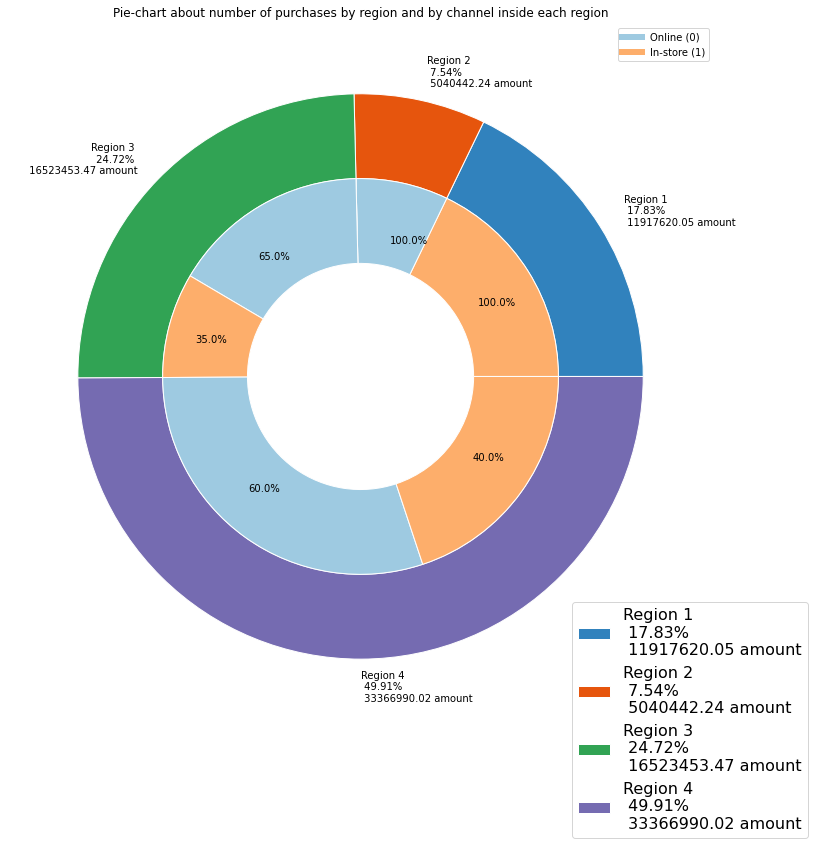

In [9]:
#we aim to create a 2 level pie chart
fig, ax = plt.subplots(figsize=(13,13))

size = 0.3
#first we get the values for the amount in each region, also separated in online and is-store
vals = np.array([data.loc[data["region"]==1,["amount","in-store"]].groupby("in-store").sum().reindex(data["in-store"].unique(),
                                                                                                     fill_value=0).values.squeeze(),
                data.loc[data["region"]==2,["amount","in-store"]].groupby("in-store").sum().reindex(data["in-store"].unique(),
                                                                                                    fill_value=0).values.squeeze(),
                data.loc[data["region"]==3,["amount","in-store"]].groupby("in-store").sum().reindex(data["in-store"].unique(),
                                                                                                    fill_value=0).values.squeeze(),
                data.loc[data["region"]==4,["amount","in-store"]].groupby("in-store").sum().reindex(data["in-store"].unique(),
                                                                                                    fill_value=0).values.squeeze()])
#for the percentages in the iner circle
sum_aux=np.sum(vals,axis=1)
prob_aux=np.array([[round(vals[i][0]/sum_aux[i],2),round(vals[i][1]/sum_aux[i],2)] for i in range(4)] )
prob_aux=prob_aux.flatten()
prob_aux=["" if(i==0) else str(i*100)+"%"  for i in prob_aux]

#percentages in the outer circle
total_aux=vals.sum(axis=None)
sum_aux_2=[round(i,2) for i in vals.sum(axis=-1)]
prob_aux_out=[round(100*i/total_aux,2) for i in sum_aux_2]

#indices for the labels
index_labels=np.array([data.loc[data["region"]==1,["amount","in-store"]].groupby("in-store").sum().reindex(data["in-store"].unique(),
                                                                                                     fill_value=0).index.values,
                data.loc[data["region"]==2,["amount","in-store"]].groupby("in-store").sum().reindex(data["in-store"].unique(),
                                                                                                    fill_value=0).index.values,
                data.loc[data["region"]==3,["amount","in-store"]].groupby("in-store").sum().reindex(data["in-store"].unique(),
                                                                                                    fill_value=0).index.values,
                data.loc[data["region"]==4,["amount","in-store"]].groupby("in-store").sum().reindex(data["in-store"].unique(),
                                                                                                    fill_value=0).index.values])
#write the labels
index_labels_text=index_labels.astype("object")
index_labels_text[index_labels==0]="online"
index_labels_text[index_labels==1]="in-store"

#colors
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(4)*4)
inner_colors = cmap(index_labels.flatten()*4+2)

#build the outer section
ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors,wedgeprops=dict(width=size, edgecolor='w'),
       labels=[f"Region 1 \n {prob_aux_out[0]}% \n {sum_aux_2[0]} amount",
              f"Region 2 \n {prob_aux_out[1]}% \n {sum_aux_2[1]} amount",
              f"Region 3 \n {prob_aux_out[2]}% \n {sum_aux_2[2]} amount",
              f"Region 4 \n {prob_aux_out[3]}% \n {sum_aux_2[3]} amount"])
fig.legend(fontsize=16,loc=4)
#build the inner chart
ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'),labels=prob_aux,labeldistance=0.7)
ax.legend([Line2D([0], [0], color=cmap(2), lw=6),
           Line2D([0], [0], color=cmap(4+2), lw=6)],["Online (0)","In-store (1)"])
ax.set(aspect="equal", title='Pie-chart about number of purchases by region and by channel inside each region');
plt.show()

From last plot we can se how important is each region in terms of total income either online or in-store.  
A lot of effort must be put in region 4 since it means almost the 50 percent of the total income,  
and region 3 is as important, in terms of amount/money, as regions 2 and 1 together.

From here we can't see if older people is more important than young one in terms of amount.  
For this purpose, I will attempt two things:
1. see if there is some correlation between age and amount (both online and in-store separately and together).
2. discretizate the ages, to work with intervals instead of the whole spectrum of values.

### 1- To investigate some kind of correlation, the 2D-histograms are very useful since in this case a scatter plot gets very messy (and theres no clear structure). 

In [10]:
plt.figure(figsize=(13,13));
#2D histogram with 1D histogram in the sides, made with plotly
px.density_heatmap(data, x="age", y="amount", marginal_x="histogram", marginal_y="histogram",
                   title="2D histogram for the relation between age and amount in the 4 regions together.")

<Figure size 936x936 with 0 Axes>

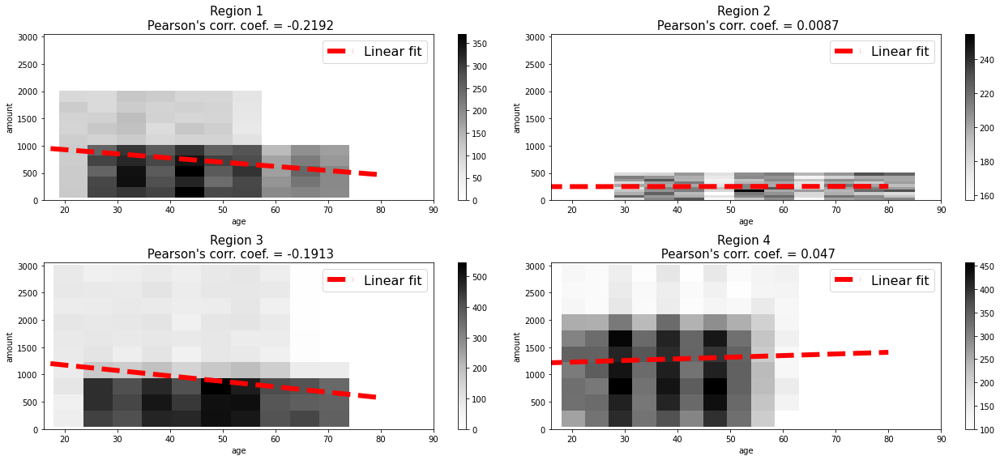

In [11]:
#2D histograms separated by regions, made with matplotlib
#also I add here the linear regresion made with the values data.loc[data["region"==i],"age"] 
#and data.loc[data["region"==i],"age"])
#and the Pearson correlation coeff. I didn't add the Spearman correlation coefficient because I saw no evidences
#that it could be needed.
fig=plt.figure(figsize=(18,8))
#loop over regions
for i in [1,2,3,4]:
    #load data from one region
    data_aux=data.loc[data["region"]==i]
    #linear fit on the data age-amount from that region
    fit_params=np.polyfit(data_aux["age"],data_aux["amount"],1)
    #compute correlation Pearsons coef.
    cor_coef=np.corrcoef(data_aux["age"],data_aux["amount"])
    #plot that info
    plt.subplot(2,2,i)
    plt.hist2d(x="age",y="amount",data=data_aux,cmap="Greys")
    plt.xlim([16,90])
    plt.ylim([0,3050])
    plt.xlabel("age")
    plt.ylabel("amount")
    plt.title(f"Region {i} \n Pearson's corr. coef. = {round(cor_coef[0,1],4)}",fontsize=15)
    plt.plot([0,80],[fit_params[1],fit_params[0]*80+fit_params[1]],"r--",linewidth=6,label="Linear fit")
    plt.legend(fontsize=16)
    plt.colorbar()
plt.tight_layout()


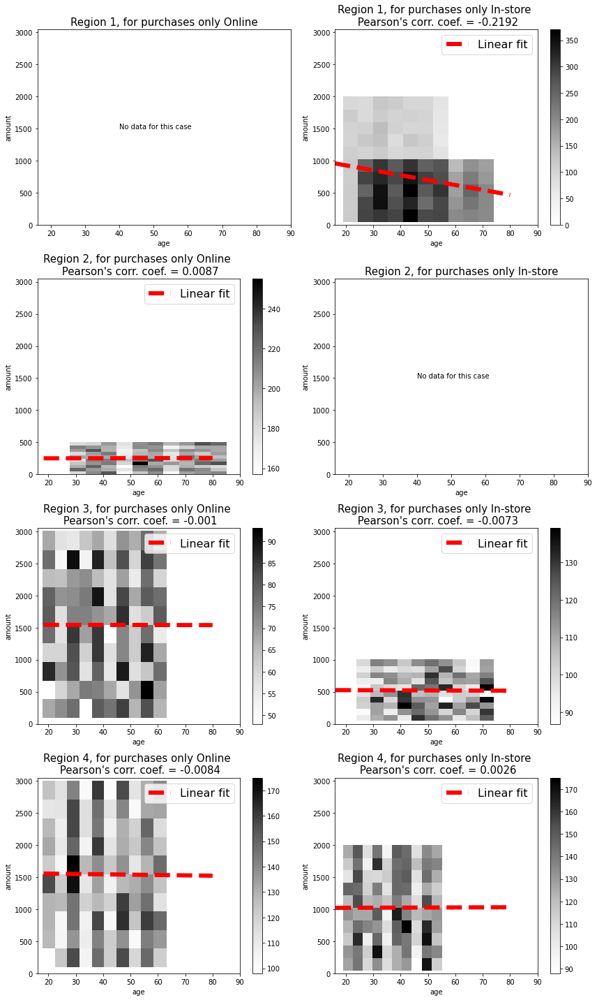

In [12]:
#to see if maybe things are different separating into channel -> online and in-store 
#lets do the same but doing such differentiation

#2D histograms separated by regions, made with matplotlib
#also I add here the linear regresion made with the values data.loc[data["region"==i],"age"] 
#and data.loc[data["region"==i],"age"])
#and the Pearson correlation coeff. I didn't add the Spearman correlation coefficient because I saw no evidences
#that it could be needed.
fig=plt.figure(figsize=(12,20))
#loop over regions
for i in [1,2,3,4]:
    #loop over channel online or in-store
    for j in [0,1]:
        data_aux=data.loc[(data["region"]==i)&(data["in-store"]==j)]
        #check if there is no data, for example in regions 1 there is no online purchases
        if not data_aux.empty:
            #linear fit on data age-amount on that region
            fit_params=np.polyfit(data_aux["age"],data_aux["amount"],1)
            #compute correlation Pearson coef.
            cor_coef=np.corrcoef(data_aux["age"],data_aux["amount"])
            #show all the info
            plt.subplot(4,2,i*2-1+j)
            plt.hist2d(x="age",y="amount",data=data_aux,cmap="Greys")
            plt.xlim([16,90])
            plt.ylim([0,3050])
            plt.xlabel("age")
            plt.ylabel("amount")
            if j==0:
                text="Online"
            else:
                text="In-store"
            plt.title(f"Region {i}, for purchases only {text} \n Pearson's corr. coef. = {round(cor_coef[0,1],4)}",
                      fontsize=15)
            plt.plot([0,80],[fit_params[1],fit_params[0]*80+fit_params[1]],"r--",linewidth=6,label="Linear fit")
            plt.legend(fontsize=16)
            plt.colorbar()
        else:
            if j==0:
                text="Online"
            else:
                text="In-store"
            #plot that there was no info about that
            plt.subplot(4,2,i*2-1+j)
            plt.title(f"Region {i}, for purchases only {text}",
                      fontsize=15)
            plt.xlim([16,90])
            plt.ylim([0,3050])
            plt.xlabel("age")
            plt.ylabel("amount")
            plt.text(40,1500,"No data for this case")
plt.tight_layout()



*(The linear fit was done with the data itself, and not using the bins from the 2D histogram, however, this graphical representation seems clearer due the huge amount of points in a scatter plot)*

Although we already performed an EDA in the task 1, these new results are useful for aswering the questions made by Daniel in the e-mail for task 2.

Sticking to what the sample data shows us, we can say that:   
**Our data shows no evidence for the claims made by Martin Goodrich about age and amount spent**.  
We can't answer yet the question: **Are customers who shop in the store older than customers who shop online?**


### 2. Discretizate the ages, to work with intervals instead of the whole spectrum of values.

I will try two different strategies for this.  
    1. Separation in three intervals with no prior justification.
        * Range 1: Young 18-30
        * Range 2: Adult 31-60
        * Range 3: Old 61-100
    2. Discretize the ages with some clustering algorithm like k-means discretization...

In [13]:
#discretize in intervals 18-30, 30-60, 60-100

data.loc[(data["age"]>=18)&(data["age"]<=30),"age_range"]=1
data.loc[(data["age"]>30)&(data["age"]<=60),"age_range"]=2
data.loc[(data["age"]>60)&(data["age"]<=100),"age_range"]=3

#check if there is any NaN in the "age_range" column
if data["age_range"].isnull().values.any():
    print("Error, some ages were not assigned an interval")
    print(data.loc[data["age_range"].isnull()])
else:
    print("All good, all ages were assigned an interval")
    colname=data.columns.values

All good, all ages were assigned an interval


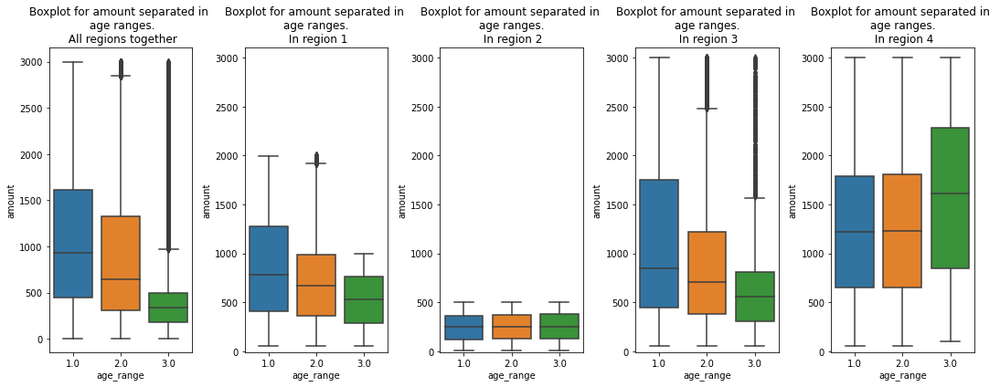

In [14]:
#boxplot for amount in the 3 chosen age ranges
plt.figure(figsize=(15,6))
plt.subplot(1,5,1)
sns.boxplot(x="age_range",y="amount", data=data)
plt.title("Boxplot for amount separated in \n age ranges.\n All regions together");
for i in [2,3,4,5]:
    plt.subplot(1,5,i)
    sns.boxplot(x="age_range",y="amount",data=data.loc[data["region"]==i-1,["age_range","amount"]])
    plt.ylim([-10,3100])
    plt.title(f"Boxplot for amount separated in \n age ranges. \n In region {i-1}");
plt.tight_layout()

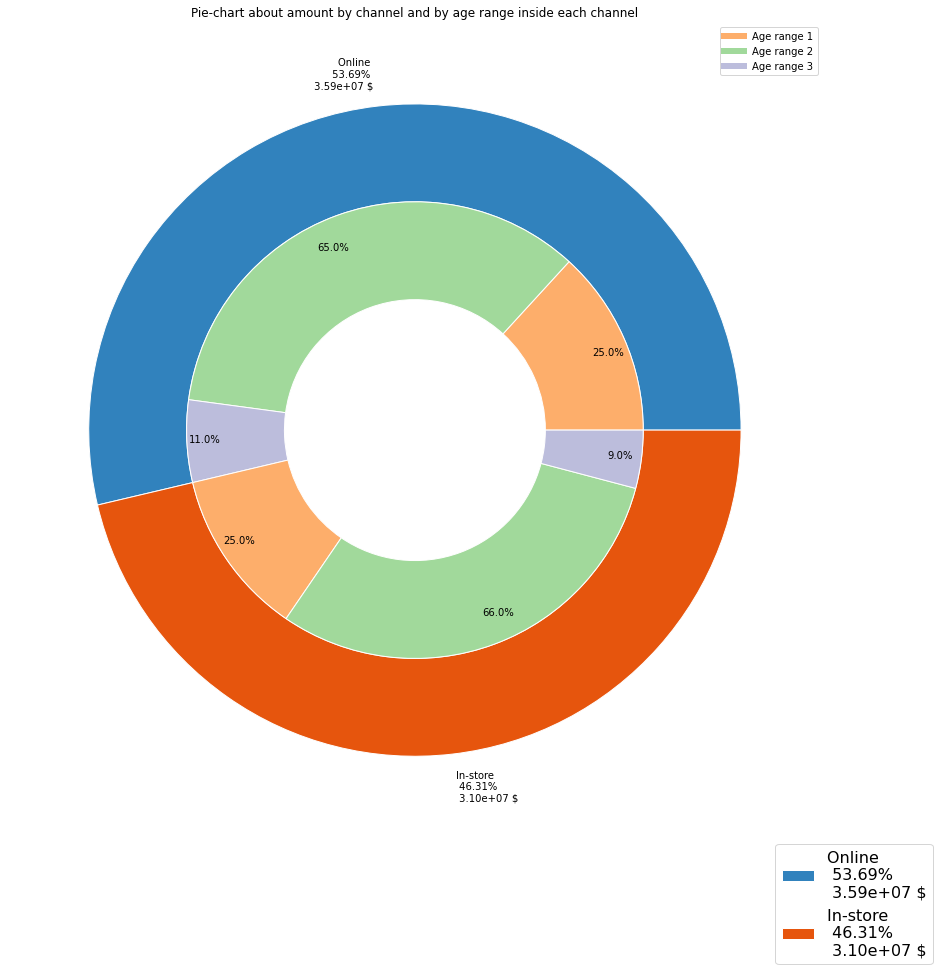

In [15]:
#lets plot the double pie chart to get insight about the percentages
fig, ax = plt.subplots(figsize=(15,15))

size = 0.3
#here I get the number of purchases in each region, online and in-store


vals = np.array([data.loc[data["in-store"]==0,["age_range","amount"]].groupby("age_range").sum().round(2).sort_index().values.squeeze(),
                data.loc[data["in-store"]==1,["age_range","amount"]].groupby("age_range").sum().round(2).sort_index().values.squeeze()])
#for the percentages in the iner circle
sum_aux=np.sum(vals,axis=1)
prob_aux=np.array([[round(vals[i][0]/sum_aux[i],2),round(vals[i][1]/sum_aux[i],2),round(vals[i][2]/sum_aux[i],2)] for i in range(2)] )
prob_aux=prob_aux.flatten()
prob_aux=["" if(i==0) else str(i*100)+"%"  for i in prob_aux]

#percentages in the outer circle
total_aux=vals.sum(axis=None)
sum_aux_2=vals.sum(axis=-1)
prob_aux_out=[round(100*i/total_aux,2) for i in sum_aux_2]

#indices for the labels
index_labels=np.array([1,2,3,1,2,3])

#colors
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(4)*4)
inner_colors = cmap(index_labels.flatten()*4+2)

#build first graph outter
ax.pie(sum_aux, radius=1, colors=outer_colors,wedgeprops=dict(width=size, edgecolor='w'),
       labels=[f"Online \n {prob_aux_out[0]}% \n {sum_aux_2[0]:.2e} $",
              f"In-store \n {prob_aux_out[1]}% \n {sum_aux_2[1]:.2e} $"])
fig.legend(fontsize=16,loc=4)
#build second graph inner
ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'),labels=prob_aux,labeldistance=0.85)
ax.legend([Line2D([0], [0], color=cmap(6), lw=6),Line2D([0], [0], color=cmap(10), lw=6),
          Line2D([0], [0], color=cmap(14), lw=6)],["Age range 1","Age range 2","Age range 3"])
ax.set(aspect="equal", title='Pie-chart about amount by channel and by age range inside each channel');
plt.show()

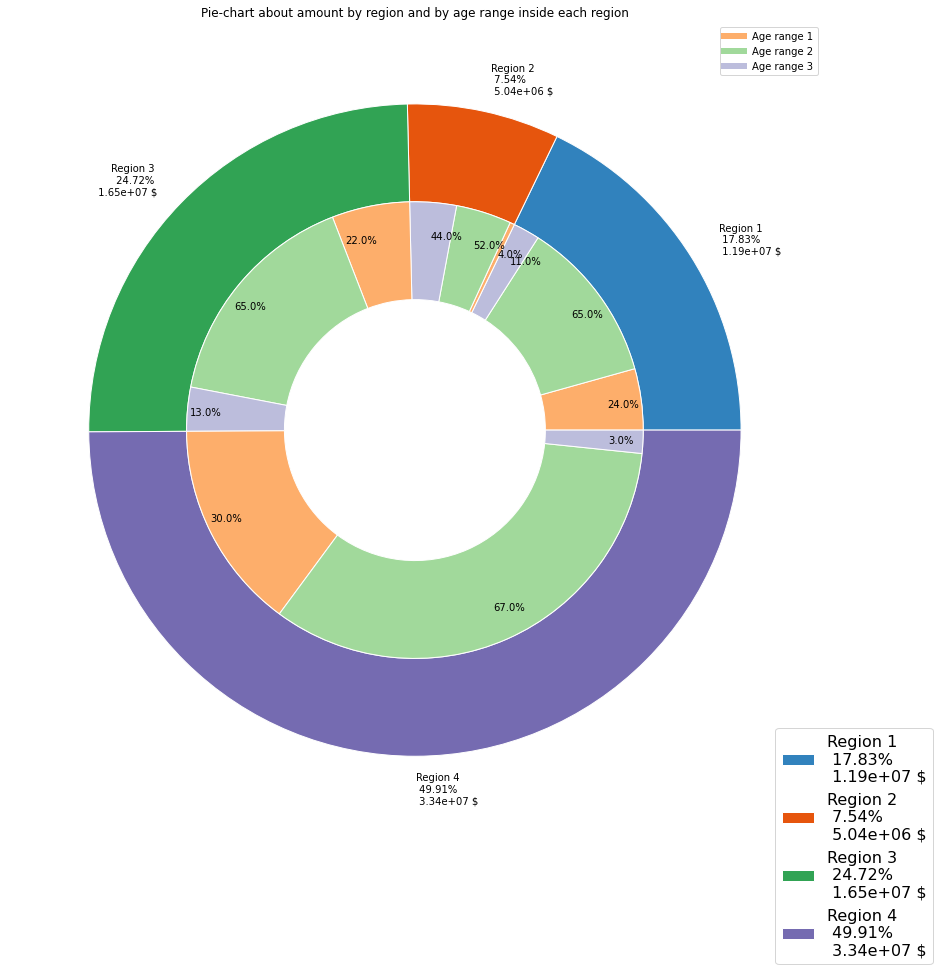

In [19]:
#lets plot the double pie chart to get insight about the percentages
fig, ax = plt.subplots(figsize=(15,15))

size = 0.3
#here I get the number of purchases in each region, online and in-store


vals = np.array([data.loc[data["region"]==1,["age_range","amount"]].groupby("age_range").sum().round(2).sort_index().values.squeeze(),
                data.loc[data["region"]==2,["age_range","amount"]].groupby("age_range").sum().round(2).sort_index().values.squeeze(),
                data.loc[data["region"]==3,["age_range","amount"]].groupby("age_range").sum().round(2).sort_index().values.squeeze(),
                data.loc[data["region"]==4,["age_range","amount"]].groupby("age_range").sum().round(2).sort_index().values.squeeze()])
#for the percentages in the iner circle
sum_aux=np.sum(vals,axis=1)
prob_aux=np.array([[round(vals[i][0]/sum_aux[i],2),round(vals[i][1]/sum_aux[i],2),round(vals[i][2]/sum_aux[i],2)] for i in range(4)] )
prob_aux=prob_aux.flatten()
prob_aux=["" if(i==0) else str(i*100)+"%"  for i in prob_aux]

#percentages in the outer circle
total_aux=vals.sum(axis=None)
sum_aux_2=vals.sum(axis=-1)
prob_aux_out=[round(100*i/total_aux,2) for i in sum_aux_2]

#indices for the labels
index_labels=np.array([1,2,3,1,2,3,1,2,3,1,2,3])

#colors
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(4)*4)
inner_colors = cmap(index_labels.flatten()*4+2)

#build first graph outter
ax.pie(sum_aux, radius=1, colors=outer_colors,wedgeprops=dict(width=size, edgecolor='w'),
       labels=[f"Region 1 \n {prob_aux_out[0]}% \n {sum_aux_2[0]:.2e} $",
              f"Region 2 \n {prob_aux_out[1]}% \n {sum_aux_2[1]:.2e} $",
              f"Region 3 \n {prob_aux_out[2]}% \n {sum_aux_2[2]:.2e} $",
              f"Region 4 \n {prob_aux_out[3]}% \n {sum_aux_2[3]:.2e} $"])
fig.legend(fontsize=16,loc=4)
#build second graph inner
ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'),labels=prob_aux,labeldistance=0.85)
ax.legend([Line2D([0], [0], color=cmap(6), lw=6),Line2D([0], [0], color=cmap(10), lw=6),
          Line2D([0], [0], color=cmap(14), lw=6)],["Age range 1","Age range 2","Age range 3"])
ax.set(aspect="equal", title='Pie-chart about amount by region and by age range inside each region');
plt.show()

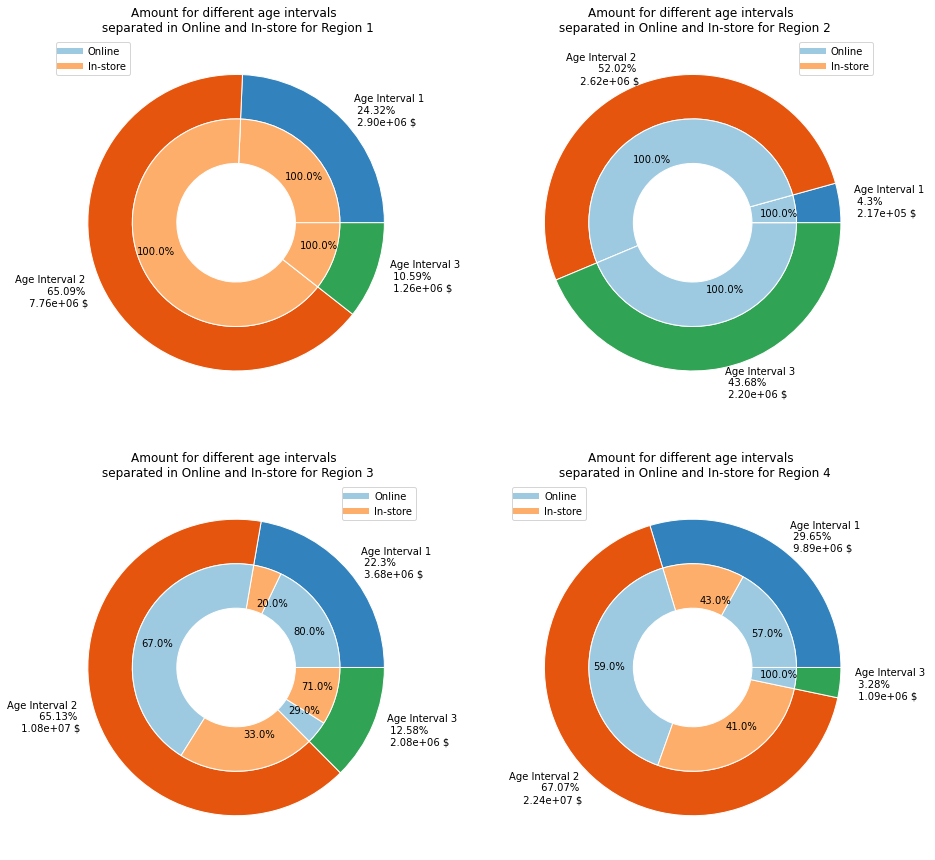

In [17]:
#lets plot the double pie chart to get insight about the percentages
plt.figure(figsize=(15,15))
for i in [1,2,3,4]:
    ax = plt.subplot(2,2,i)
    size = 0.3
    #here I get the number of purchases in each region, online and in-store


    vals = np.array([data.loc[(data["region"]==i)&(data["age_range"]==1),["in-store","amount"]].groupby("in-store").sum().reindex(data["in-store"].unique(),fill_value=0).values.squeeze(),
                    data.loc[(data["region"]==i)&(data["age_range"]==2),["in-store","amount"]].groupby("in-store").sum().reindex(data["in-store"].unique(),fill_value=0).values.squeeze(),
                    data.loc[(data["region"]==i)&(data["age_range"]==3),["in-store","amount"]].groupby("in-store").sum().reindex(data["in-store"].unique(),fill_value=0).values.squeeze()])
    #for the percentages in the inner circle
    sum_aux=np.sum(vals,axis=1)
    prob_aux=np.array([[round(vals[i][0]/sum_aux[i],2),round(vals[i][1]/sum_aux[i],2)] for i in range(3)] )
    prob_aux=prob_aux.flatten()
    prob_aux=["" if(i==0) else str(round(i*100,2))+"%"  for i in prob_aux]

    #percentages in the outer circle
    total_aux=vals.sum(axis=None)
    sum_aux_2=vals.sum(axis=-1)
    prob_aux_out=[round(100*i/total_aux,2) for i in sum_aux_2]

    #indices for the labels
    index_labels=np.array([data.loc[(data["region"]==i)&(data["age_range"]==1),["in-store","amount"]].groupby("in-store").sum().reindex(data["in-store"].unique(),fill_value=0).index.values,
                          data.loc[(data["region"]==i)&(data["age_range"]==2),["in-store","amount"]].groupby("in-store").sum().reindex(data["in-store"].unique(),fill_value=0).index.values,
                          data.loc[(data["region"]==i)&(data["age_range"]==3),["in-store","amount"]].groupby("in-store").sum().reindex(data["in-store"].unique(),fill_value=0).index.values]).flatten()
    index_labels_text=index_labels.astype("object")
    index_labels_text[index_labels==0]="online"
    index_labels_text[index_labels==1]="in-store"

    #colors
    cmap = plt.get_cmap("tab20c")
    outer_colors = cmap(np.arange(4)*4)
    inner_colors = cmap(index_labels.flatten()*4+2)

    #build first graph outter
    ax.pie(sum_aux, radius=1, colors=outer_colors,wedgeprops=dict(width=size, edgecolor='w'),
           labels=[f"Age Interval 1 \n {prob_aux_out[0]}% \n {sum_aux_2[0]:.2e} $",
                  f"Age Interval 2 \n {prob_aux_out[1]}% \n {sum_aux_2[1]:.2e} $",
                  f"Age Interval 3 \n {prob_aux_out[2]}% \n {sum_aux_2[2]:.2e} $"])
    fig.legend(fontsize=16,loc=4)
    #build second graph inner
    ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
           wedgeprops=dict(width=size, edgecolor='w'),labels=prob_aux,labeldistance=0.65)
    ax.legend([Line2D([0], [0], color=cmap(2), lw=6),Line2D([0], [0], color=cmap(6), lw=6)],["Online","In-store"])
    ax.set(aspect="equal", title=f'Amount for different age intervals \n separated in Online and In-store for Region {i}');
plt.show()

From last graphs it is clearer what percentage of the total income for each region, comes from which interval of ages.

Remember:  
        * Interval 1: Young 18-30
        * Interval 2: Adult 31-60
        * Interval 3: Old 61-100


In [18]:
#Now lets experiment with other age intervals
age_aux=data.age.to_numpy().reshape(-1,1)

#for 3 bins
discret=KBinsDiscretizer(n_bins=3,strategy="kmeans")
discret.fit(age_aux)
print("Three bins: ",discret.bin_edges_[0])

#for 4 bins
discret=KBinsDiscretizer(n_bins=4,strategy="kmeans")
discret.fit(age_aux)
print("Four bins: ", discret.bin_edges_[0])

Three bins:  [18.         40.04901439 59.36283457 85.        ]
Four bins:  [18.         35.28850173 49.29510504 64.53592302 85.        ]


#### We have new intervals to experiment with:
Age arrangement 1: (the one we have already used)
        * Interval 1: Young 18-30
        * Interval 2: Adult 31-60
        * Interval 3: Old 61-100
        
Age arrangement 2:
    * Interval 1: Young 18-40
    * Interval 2: Adult 40-59
    * Interval 3: Old 59-100
    
Age arrangement 3:
    * Interval 1: Young 18-35
    * Interval 2: Adult 35-49
    * Interval 3: Adult 2 49-64
    * Interval 4: Old 64-100

                  
        


I could do the same plots I've already done for the new intervals, but since this is Task 2, and it is about building an ML model, and the EDA was for task 1, I will go ahead with the models directly. (Also, I did the plots and I found nothing fascinating)

Nonetheless, I'll take these intevals into account while building the models.

## Building predictive models 

The main objective of this task 2, is to build predictive models. In the original e-mail two models are explicitly mentioned:

* **Predict the age based on other demographic data.** This statement can be a bit misunderstanding, because of the definition of "Demographic Data", however, we don't any extra data, and since the data file is called "Demographic_data.csv", I'll take all of it as "Demographic". The prediction model will be built for all regions together and for each one individually.

* Build a model to know if it is true the statement: **customers who shop in the store are older than customers who shop online.** I'll build a model that predicts the channel (online,in-store) with respect to the other variables, and see what role plays the age range, and together with the EDA we did about age_range and channel, we will be able to draw conclusions.


Other models that are asked in the POA are:

* Discretize amount and use it as dependent variable. **A model for predicting the amount spent**
* **A model for predicting the region where a purchase took place.**


I will follow the steps Felix gave us for **build and employ a ML model**:
1. Choose an algorithm.
2. Split the data into training and testing sets.
3. Tune the hyperparameters using CV. (with training data)
4. When we found the best hyperparameters, test the performance on unseen data (test data).  
5. Train on all the available data, and deploy you model for making predictions. (train and test data together)  
This last point is for further use of a model, here it is not necessary since we won't use it.


An insteresting question to ask is: Which metric we should use for chosing the best model when using gridsearch with cross-validation?  
For now we will proceed with accuracy, but there's many other options an them are more useful than others, depending on the situation.  
For example, with imbalanced datasets, the balanced_accuracy is an interesting option.


**Side-note**: because the low bias and high variance this tree-based learning algorithms show, our goal now is to find the lowest Total Error in the variance-bias trade off, reducing the variance.  
A way of doing that is increasion the bias, and a way of increasing the bias, I think can be by limitating the ages by intervals as we have done. Also the amount could be a possible option for binning the data even more. Doing such binning we make assumption about the data, and raise the bias, therefore we low the variance.

### First model: Predict the age based on other demographic data

*(I will take as demographic data any variable that is in the file Demographic_data.csv)*

Because the prediction is going to be made with age ranges instead of ages itself, we will try to use dummy variables.

The search of the best model will be done between algorithms(Decision Tree, Random Forest, GradientBoosting), discretizations (3 different ones), change of hyperparameters of each algorithm.

I will check if the use of dummie variables improve the performance, however probably tree based model do not need dummie variables for enhancing performance. Lets check both. Dummie variables would be used for the region, since there is no other categorical independent variable to apply it, later on I will discretize the amount, but altough it can add a bit of noise to the classification, I think it is useful to give as much information to the algorithm as possible.

Our baseline for this model will be the random choice of predicting the age given 3 intervals, 33% of accuracy (or four intervals in one case, 25%). But since not all intervals are equally "crowded", this baseline is a bit naive.

#### NOTE:
There is a possible problem we should avoid when training a model. It's possible that a class from out data, is larger than the others, therfore the training won't be balanced (imbalanced data).  
In this cases, the model can chose to learn only one class, since it gives good accuracy, but terrible precision.  

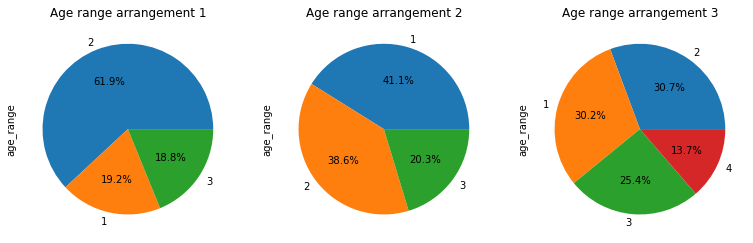

In [18]:
#lets check if out data can have this problem of imbalanced classes.
plt.figure(figsize=(13,5))
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]
#loop over the age intervals we have proposed
for i,interval in enumerate(age_intervals):
    data_aux=data.copy()
    #discretize in intervals 
    for p,m in enumerate(interval):
        data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1

    data_aux["age_range"]=data_aux["age_range"].astype("int")
    #plot the results
    plt.subplot(1,3,i+1)
    plt.title(f"Age range arrangement {i+1}")
    data_aux["age_range"].value_counts().plot.pie(autopct='%1.1f%%')


As we can see, the amount of each class in the dependent variable is not equal, therefore we can have problems if the algorithm finds that dismissing a whole class, it improves accuracy. That the perfect example of why accuracy is not enough some times.

In [19]:
#Now, I perform hyperparameters tuning

#preproccess data

#data discretization was done in the last steps of the EDA performed in this report.
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]


#I build a loop for each discretization
#Inside it, I build a grid search for the parameters I want to change in the algorithms
#For now i consider the data of all regions all together.
parameters_DT={"max_depth":[2,3,4,5,7,10],"max_features":(None,"auto")}
parameters_RF={"n_estimators":[5,10,25,35,50],"max_depth":[2,3,4,5,7]}
parameters_GB={"n_estimators":[10,30,50,100]}
#those lists are for saving the results for each age-interval loop
tune_DT={}
tune_RF={}
tune_GB={}
for i,interval in enumerate(age_intervals):
    data_aux=data.copy()
    
    #discretize in intervals 
    for p,m in enumerate(interval):
        data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1

    data_aux["age_range"]=data_aux["age_range"].astype("int")

    #check if there is any NaN in the "age_range" column
    if data_aux["age_range"].isnull().values.any():
        print(f"Error, some ages were not assigned an interval. Intervalos: {i}")
        print(data_aux.loc[data_aux["age_range"].isnull()])
        break
    else:
        print("All good, all ages were assigned an interval")
        colname=data_aux.columns.values
       
    #put together the data
    data_aux=data_aux.join(pd.get_dummies(data_aux.region,"region"))
    
    for m,k in enumerate(["With region as Dummie variable","Without using Dummie variables"]):

        #now split the data, the train will be used for tuning, and the test, for testing the last best model
        if m==0:
            text="dummie"
            #if m=0 then the use dummie variables
            x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount","region_1",
                                                                          "region_2","region_3","region_4"]],
                                                       data_aux["age_range"],test_size=0.2)
        elif m==1:
            text="not_dummie"

            x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount","region"]],
                                                       data_aux["age_range"],test_size=0.2)

        else:
            print("Error")
            
        #build the models and the gridsearch instances
        #the search is made using crossvalidation, with 5 folds
        tree1=DecisionTreeClassifier()
        forest=RandomForestClassifier()
        boost=GradientBoostingClassifier()
        tree_search=GridSearchCV(tree1,parameters_DT)
        forest_search=GridSearchCV(forest,parameters_RF)
        boost_search=GridSearchCV(boost,parameters_GB)

        #give the data for cross validation search of best hyperparameters
        tree_search.fit(x_train,y_train)
        forest_search.fit(x_train,y_train)
        boost_search.fit(x_train,y_train)

        #print the best results
        print(text,": Age intervals: ",i,". Tree: ",tree_search.best_params_," with score: ",tree_search.best_score_)
        print(text,": Age intervals: ",i," Forest: ",forest_search.best_params_," with score: ",forest_search.best_score_)
        print(text,": Age intervals: ",i," GradBoost: ",boost_search.best_params_," with score: ",boost_search.best_score_)
        #with tree_search.cv_results_, we could serach for further information in the results

        #now we save this for later analysis
        tune_DT[f"{i}_{text}"]=tree_search
        tune_RF[f"{i}_{text}"]=forest_search
        tune_GB[f"{i}_{text}"]=boost_search

All good, all ages were assigned an interval
dummie : Age intervals:  0 . Tree:  {'max_depth': 2, 'max_features': 'auto'}  with score:  0.618883141497073
dummie : Age intervals:  0  Forest:  {'max_depth': 4, 'n_estimators': 10}  with score:  0.6188831427184439
dummie : Age intervals:  0  GradBoost:  {'n_estimators': 10}  with score:  0.6188362518440564
not_dummie : Age intervals:  0 . Tree:  {'max_depth': 2, 'max_features': None}  with score:  0.6201803608286494
not_dummie : Age intervals:  0  Forest:  {'max_depth': 5, 'n_estimators': 25}  with score:  0.6202897626907956
not_dummie : Age intervals:  0  GradBoost:  {'n_estimators': 10}  with score:  0.6201647321656815
All good, all ages were assigned an interval
dummie : Age intervals:  1 . Tree:  {'max_depth': 5, 'max_features': None}  with score:  0.4773611732958571
dummie : Age intervals:  1  Forest:  {'max_depth': 4, 'n_estimators': 25}  with score:  0.4780801418685896
dummie : Age intervals:  1  GradBoost:  {'n_estimators': 30}  wi

For this tuning of hyperparameters above, we have found very similar results between the 3 different algorithms we have tested (Tree, Forest and Gradient). Due to the similarity of the results, and because of its readability, we will build the final model using the Decision Trees. Also, the use of dummie variables made no visible improvement.

Relative to which age inteval arrengement to use, the performance of the first age arrangement (18-30,30-60,60-100) showed the best performance.

In [20]:
#lets train the final model we have chosen, and test it in the test data
age_intervals=[[18,30],[31,60],[61,100]]
data_aux=data.copy()

#discretize in intervals 
for p,m in enumerate(age_intervals):
    data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1
data_aux["age_range"]=data_aux["age_range"].astype("int")
#split the data
x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount","region"]],
                                               data_aux["age_range"],test_size=0.2)

#create and train the model
final_model_age=DecisionTreeClassifier(max_depth= 2, max_features= None)
final_model_age.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=2)

              precision    recall  f1-score   support

 Age range 1       0.00      0.00      0.00     12294
 Age range 2       0.62      1.00      0.76     39597
 Age range 3       0.00      0.00      0.00     12092

    accuracy                           0.62     63983
   macro avg       0.21      0.33      0.25     63983
weighted avg       0.38      0.62      0.47     63983



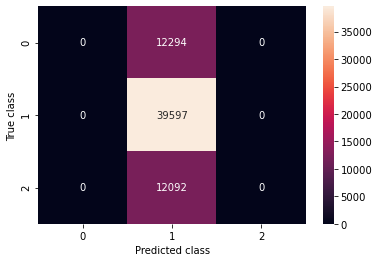

In [23]:
#we do the evaluation on the training data first
y_predict=final_model_age.predict(x_train)
conf=confusion_matrix(y_train.to_numpy(),y_predict)
sns.heatmap(conf,annot=True,fmt="d")
plt.ylabel("True class")
plt.xlabel("Predicted class")
report=classification_report(y_train.to_numpy(),y_predict,
                             zero_division=0,target_names=["Age range 1","Age range 2","Age range 3"])
print(report)

              precision    recall  f1-score   support

 Age range 1       0.00      0.00      0.00      3089
 Age range 2       0.62      1.00      0.77      9933
 Age range 3       0.00      0.00      0.00      2974

    accuracy                           0.62     15996
   macro avg       0.21      0.33      0.26     15996
weighted avg       0.39      0.62      0.48     15996



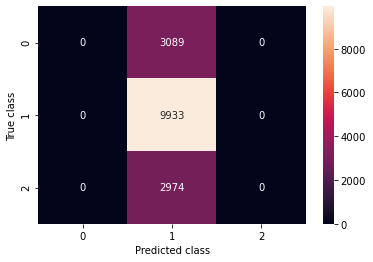

In [24]:
#now we evaluate the model with never seen data, test_set
y_predict=final_model_age.predict(x_test)
conf=confusion_matrix(y_test.to_numpy(),y_predict);
sns.heatmap(conf,annot=True,fmt="d");
plt.ylabel("True class")
plt.xlabel("Predicted class")

report=classification_report(y_test.to_numpy(),y_predict,zero_division=0,
                             target_names=["Age range 1","Age range 2","Age range 3"]);
print(report)


This last cells are the reason why it is so important to properly test and evaluate the model. The metrics (precision, recall...) and confusion matrix helps us to understand how the model is doing its job, and the accuracy is not enough for evaluatinga model, specially with imbalanced data.
For this case, because of the imbalanced data, all the interest of the model was in the age-range with more people in it.  
To handle imbalanced data we have many options, two of them are:  
* Over-sampling  
* Under-sampling

*(check out the resource I've used https://www.kaggle.com/rafjaa/resampling-strategies-for-imbalanced-datasets)*

**Imbalanced** library is very useful for very advance methods on imbalanced data.  
However this is not the objective of this task 2.
Therefore I'll procceed with a very simple under-sampling.


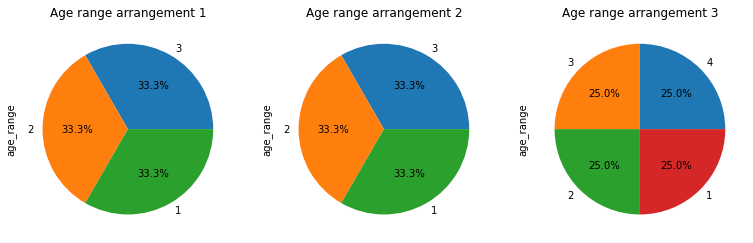

In [23]:
#SOLVE THE IMBALANCE DATA BY UNDERSAMPLING

plt.figure(figsize=(13,5))
#define the age range arrangements
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]
#loop over the 3 different age range arrangements
for i,interval in enumerate(age_intervals):
    data_aux=data.copy()
    #discretize in intervals 
    for p,m in enumerate(interval):
        data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1
    #turn the value into intiger
    data_aux["age_range"]=data_aux["age_range"].astype("int")
    
    #here is where I apply undersampling for having as much elements as the one that has less
    minumum=np.amin(data_aux["age_range"].value_counts())
    for p,m in enumerate(interval):
        data_aux=data_aux.drop(data_aux.loc[data_aux["age_range"]==p+1].index[minumum:])
    #plot the amount percentage of data for each class (age interval)
    plt.subplot(1,3,i+1)
    plt.title(f"Age range arrangement {i+1}")
    data_aux["age_range"].value_counts().plot.pie(autopct='%1.1f%%')


Now, I just apply this undersampling to the code for the hyperparameter tuning.

In [24]:
#Now, I perform hyperparameters tuning

#preproccess data

#data discretization was done in the last steps of the EDA performed in this report.
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]


#I build a loop for each discretization
#Inside it, I build a grid search for the parameters I want to change in the algorithms
#For now i consider the data of all regions all together.
parameters_DT={"max_depth":[2,3,4,5,7,10],"max_features":(None,"auto")}
parameters_RF={"n_estimators":[5,10,25,35,50],"max_depth":[2,3,4,5,7]}
parameters_GB={"n_estimators":[10,30,50,100]}
#those lists are for saving the results for each age-interval loop
tune_DT={}
tune_RF={}
tune_GB={}

#loop over the age arrangement we have defined
for i,interval in enumerate(age_intervals):
    data_aux=data.copy()
    #discretize in intervals 
    for p,m in enumerate(interval):
        data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1

    data_aux["age_range"]=data_aux["age_range"].astype("int")
    
    #here is where I apply undersampling for having as much elements as the one that has less
    minumum=np.amin(data_aux["age_range"].value_counts())
    for p,m in enumerate(interval):
        data_aux=data_aux.drop(data_aux.loc[data_aux["age_range"]==p+1].index[minumum:])
            

    #check if there is any NaN in the "age_range" column
    if data_aux["age_range"].isnull().values.any():
        print(f"Error, some ages were not assigned an interval. Intervalos: {i}")
        print(data_aux.loc[data_aux["age_range"].isnull()])
        break
    else:
        print("All good, all ages were assigned an interval")
        colname=data_aux.columns.values
       
    #put together the data
    data_aux=data_aux.join(pd.get_dummies(data_aux.region,"region"))
    
    #loop over the use of dummie variables
    for m,k in enumerate(["With region as Dummie variable","Without using Dummie variables"]):

        #now split the data, the train will be used for tuning, and the test, for testing the last best model
        if m==0:
            text="dummie"
            #if m=0 then the use dummie variables
            x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount","region_1",
                                                                          "region_2","region_3","region_4"]],
                                                       data_aux["age_range"],test_size=0.2)
        elif m==1:
            text="not_dummie"

            x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount","region"]],
                                                       data_aux["age_range"],test_size=0.2)

        else:
            print("Error")
            
        #build the models and the gridsearch instances
        #the search is made using crossvalidation, with 5 folds
        tree1=DecisionTreeClassifier()
        forest=RandomForestClassifier()
        boost=GradientBoostingClassifier()
        tree_search=GridSearchCV(tree1,parameters_DT)
        forest_search=GridSearchCV(forest,parameters_RF)
        boost_search=GridSearchCV(boost,parameters_GB)

        #give the data for cross validation search of best hyperparameters
        tree_search.fit(x_train,y_train)
        forest_search.fit(x_train,y_train)
        boost_search.fit(x_train,y_train)

        #print the best results
        print(text,": Age intervals: ",i,". Tree: ",tree_search.best_params_," with score: ",tree_search.best_score_)
        print(text,": Age intervals: ",i," Forest: ",forest_search.best_params_," with score: ",forest_search.best_score_)
        print(text,": Age intervals: ",i," GradBoost: ",boost_search.best_params_," with score: ",boost_search.best_score_)
        #with tree_search.cv_results_, we could serach for further information in the results

        #now we save this for later analysis
        tune_DT[f"{i}_{text}"]=tree_search
        tune_RF[f"{i}_{text}"]=forest_search
        tune_GB[f"{i}_{text}"]=boost_search

All good, all ages were assigned an interval
dummie : Age intervals:  0 . Tree:  {'max_depth': 4, 'max_features': None}  with score:  0.5467668970435795
dummie : Age intervals:  0  Forest:  {'max_depth': 7, 'n_estimators': 50}  with score:  0.5483985648076191
dummie : Age intervals:  0  GradBoost:  {'n_estimators': 30}  with score:  0.546656338766349
not_dummie : Age intervals:  0 . Tree:  {'max_depth': 4, 'max_features': None}  with score:  0.5456055417738034
not_dummie : Age intervals:  0  Forest:  {'max_depth': 5, 'n_estimators': 25}  with score:  0.5465735653889412
not_dummie : Age intervals:  0  GradBoost:  {'n_estimators': 50}  with score:  0.5424804652840585
All good, all ages were assigned an interval
dummie : Age intervals:  1 . Tree:  {'max_depth': 5, 'max_features': 'auto'}  with score:  0.5047179487179487
dummie : Age intervals:  1  Forest:  {'max_depth': 4, 'n_estimators': 35}  with score:  0.5034358974358975
dummie : Age intervals:  1  GradBoost:  {'n_estimators': 50}  wi

Despite being very inefficient, because we are using less resources than we have available, subsampling seems that has worked for this occasion. For a more professional study, more sophisticated techniques can be used, but those are not the objective of task 2.

Between the 3 algorithms there is not a big differences, for simplicity and readability I will use Decision trees.  
Also, the use of dummie variables for the region, doesn't change to much the accuracies.  

Lets train and test a DecisionTree model for the 3 different age ranges we have tried.

Report on Training data for the Age range arrangement 1 -> [[18, 30], [31, 60], [61, 100]] 
               precision    recall  f1-score   support

 Age range 1       0.56      0.70      0.62     12086
 Age range 2       0.37      0.12      0.18     12034
 Age range 3       0.58      0.83      0.68     12038

    accuracy                           0.55     36158
   macro avg       0.50      0.55      0.50     36158
weighted avg       0.50      0.55      0.50     36158

Report on Testing data for the Age range arrangement 1 -> [[18, 30], [31, 60], [61, 100]] 
               precision    recall  f1-score   support

 Age range 1       0.55      0.70      0.61      2980
 Age range 2       0.33      0.11      0.16      3032
 Age range 3       0.58      0.83      0.68      3028

    accuracy                           0.54      9040
   macro avg       0.49      0.54      0.49      9040
weighted avg       0.49      0.54      0.48      9040

Report on Training data for the Age range arrangement

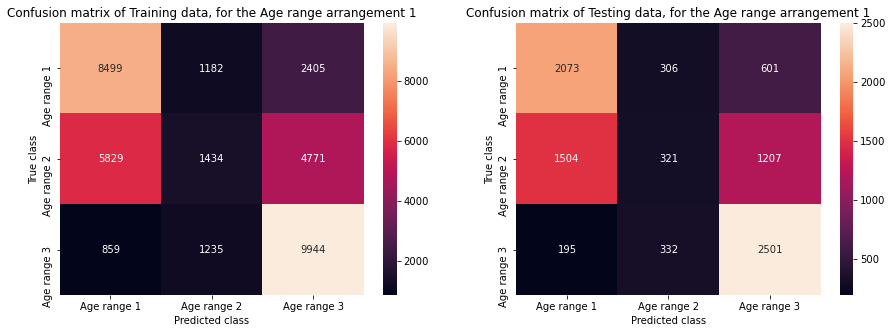

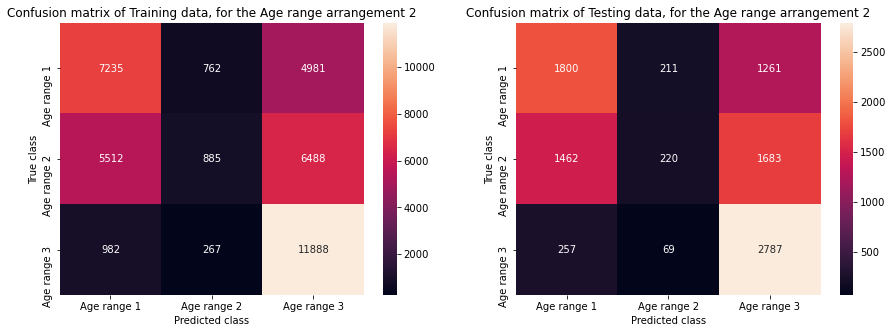

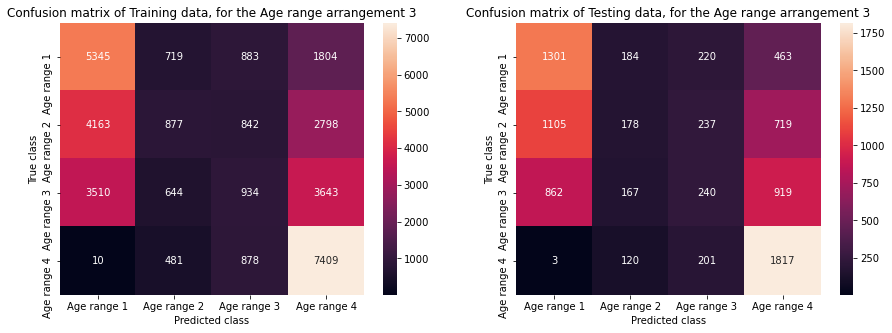

In [25]:
#lets train the final model we have chosen, and test it in the test data
#we also perform an analysis on the training data, because comparing the results 
#with the testing data, overfitting or other malfunctions could be found
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]

for i,interval in enumerate(age_intervals):
    data_aux=data.copy()
    #discretize in intervals 
    labels_name=[]
    for p,m in enumerate(interval):
        data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1
        labels_name.append(f"Age range {p+1}")
    data_aux["age_range"]=data_aux["age_range"].astype("int")
    
    #here is where I apply undersampling for having as much elements as the one that has less
    minumum=np.amin(data_aux["age_range"].value_counts())
    for p,m in enumerate(interval):
        data_aux=data_aux.drop(data_aux.loc[data_aux["age_range"]==p+1].index[minumum:])
    
    x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount","region"]],
                                                   data_aux["age_range"],test_size=0.2)

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    
    final_model_age=DecisionTreeClassifier(max_depth= 5, max_features= None)
    final_model_age.fit(x_train,y_train)
    #we do the evaluation on the training data first
    y_predict=final_model_age.predict(x_train)
    conf=confusion_matrix(y_train.to_numpy(),y_predict)
    sns.heatmap(conf,annot=True,fmt="d",xticklabels=labels_name,
                yticklabels=labels_name)
    plt.title(f"Confusion matrix of Training data, for the Age range arrangement {i+1}")
    plt.ylabel("True class")
    plt.xlabel("Predicted class")

    report=classification_report(y_train.to_numpy(),y_predict,target_names=labels_name)
    print(f"Report on Training data for the Age range arrangement {i+1} -> {str(interval)} \n",report)

    plt.subplot(1,2,2)
    #we do the evaluation on the training data first
    y_predict=final_model_age.predict(x_test)
    conf=confusion_matrix(y_test.to_numpy(),y_predict)
    sns.heatmap(conf,annot=True,fmt="d",xticklabels=labels_name,
                yticklabels=labels_name)
    plt.title(f"Confusion matrix of Testing data, for the Age range arrangement {i+1}")
    plt.ylabel("True class")
    plt.xlabel("Predicted class")

    report=classification_report(y_test.to_numpy(),y_predict,target_names=labels_name)
    print(f"Report on Testing data for the Age range arrangement {i+1} -> {str(interval)} \n",report)

On these results, we can see that with the models we have built, and with the data we have, it doesn't seem possible to build a model for age_range prediction. The metrics (prediction and recall are very low), and even though the accuracy is high, from those metrics, and from the confusion matrix, it is clear that the models are not performing as required.

The main problem is in the Age_range=2, the models are not capable of classifying it. Also it shows a lack on robustness, each time I run the training, the models change how the classification is done. In this case it is due, probably, to the lack of good point for splitting the variables, there is not enough relation between the variables for making guesses, and the model doesn't perform certain/accurate decisions.

#### Predict the age interval for each region individually

We still use the under-sampling technique

In [26]:
#Now, I perform hyperparameters tuning for 

#preproccess data

#data discretization was done in the last steps of the EDA performed in this report.
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]


#I build a loop for each discretization
#Inside it, I build a grid search for the parameters I want to change in the algorithms
#For now i consider the data of all regions all together.
parameters_DT={"max_depth":[2,3,4,5,7,10],"max_features":(None,"auto")}
parameters_RF={"n_estimators":[5,10,25,35,50],"max_depth":[2,3,4,5,7]}
parameters_GB={"n_estimators":[10,30,50,100]}
#those lists are for saving the results for each age-interval loop
tune_DT={}
tune_RF={}
tune_GB={}

#loop over each region
for r,region in enumerate([1,2,3,4]):

    print("\n REGION ", region,"\n ------------------------------------------------ \n")
    #loop over the age arrangement we have defined
    for i,interval in enumerate(age_intervals):
        #we use only the data from one region at a time
        data_aux=data.loc[data["region"]==region].copy()
        #discretize in intervals 
        for p,m in enumerate(interval):
            data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1

        data_aux["age_range"]=data_aux["age_range"].astype("int")

        #here is where I apply undersampling for having as much elements as the one that has less
        minumum=np.amin(data_aux["age_range"].value_counts())
        for p,m in enumerate(interval):
            data_aux=data_aux.drop(data_aux.loc[data_aux["age_range"]==p+1].index[minumum:])


        #check if there is any NaN in the "age_range" column
        if data_aux["age_range"].isnull().values.any():
            print(f"Error, some ages were not assigned an interval. Intervalos: {i}")
            print(data_aux.loc[data_aux["age_range"].isnull()])
            break
        else:
            print("All good, all ages were assigned an interval")
            colname=data_aux.columns.values

        x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount"]],
                                                   data_aux["age_range"],test_size=0.2)

        #build the models and the gridsearch instances
        #the search is made using crossvalidation, with 5 folds
        tree1=DecisionTreeClassifier()
        forest=RandomForestClassifier()
        boost=GradientBoostingClassifier()
        tree_search=GridSearchCV(tree1,parameters_DT)
        forest_search=GridSearchCV(forest,parameters_RF)
        boost_search=GridSearchCV(boost,parameters_GB)

        #give the data for cross validation search of best hyperparameters
        tree_search.fit(x_train,y_train)
        forest_search.fit(x_train,y_train)
        boost_search.fit(x_train,y_train)

        #print the best results
        print("Age intervals: ",i,". Tree: ",tree_search.best_params_," with score: ",tree_search.best_score_)
        print("Age intervals: ",i," Forest: ",forest_search.best_params_," with score: ",forest_search.best_score_)
        print("Age intervals: ",i," GradBoost: ",boost_search.best_params_," with score: ",boost_search.best_score_)
        #with tree_search.cv_results_, we could serach for further information in the results

        #now we save this for later analysis
        tune_DT[f"{i}_{region}"]=tree_search
        tune_RF[f"{i}_{region}"]=forest_search
        tune_GB[f"{i}_{region}"]=boost_search


 REGION  1 
 ------------------------------------------------ 

All good, all ages were assigned an interval
Age intervals:  0 . Tree:  {'max_depth': 2, 'max_features': None}  with score:  0.44836365376391035
Age intervals:  0  Forest:  {'max_depth': 4, 'n_estimators': 35}  with score:  0.44992014905509714
Age intervals:  0  GradBoost:  {'n_estimators': 10}  with score:  0.4449041938194771
All good, all ages were assigned an interval
Age intervals:  1 . Tree:  {'max_depth': 2, 'max_features': None}  with score:  0.4365615649932154
Age intervals:  1  Forest:  {'max_depth': 2, 'n_estimators': 35}  with score:  0.43623846321615567
Age intervals:  1  GradBoost:  {'n_estimators': 10}  with score:  0.4336523430102794
All good, all ages were assigned an interval
Age intervals:  2 . Tree:  {'max_depth': 2, 'max_features': None}  with score:  0.33333186803139025
Age intervals:  2  Forest:  {'max_depth': 2, 'n_estimators': 50}  with score:  0.3335191336197119
Age intervals:  2  GradBoost:  {'n_


 REGION  1 
 ------------------------------------------------ 

All good, all ages were assigned an interval
Report on Training data for the Age range arrangement 1 -> [[18, 30], [31, 60], [61, 100]] 
               precision    recall  f1-score   support

 Age range 1       0.59      0.34      0.43      1925
 Age range 2       0.38      0.07      0.12      1932
 Age range 3       0.42      0.94      0.58      1924

    accuracy                           0.45      5781
   macro avg       0.46      0.45      0.38      5781
weighted avg       0.46      0.45      0.38      5781

Report on Testing data for the Age range arrangement 1 -> [[18, 30], [31, 60], [61, 100]] 
               precision    recall  f1-score   support

 Age range 1       0.61      0.35      0.45       484
 Age range 2       0.32      0.06      0.11       477
 Age range 3       0.42      0.92      0.57       485

    accuracy                           0.45      1446
   macro avg       0.45      0.45      0.38      144

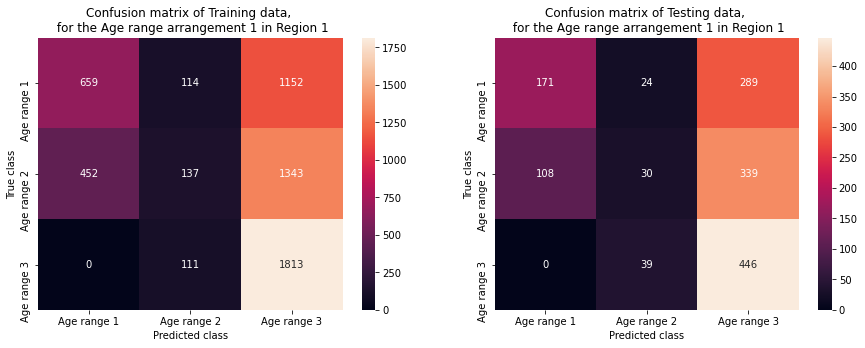

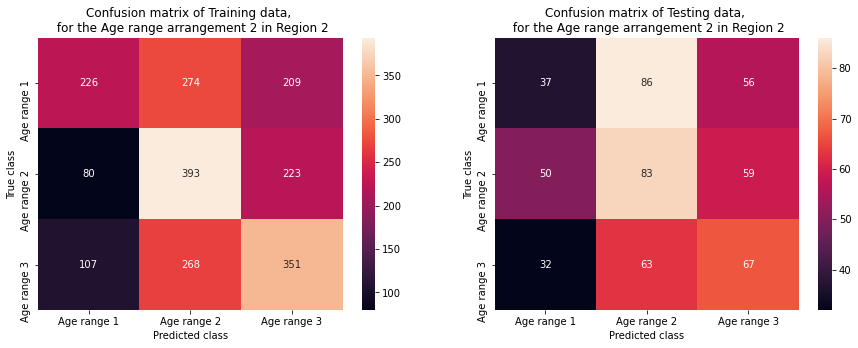

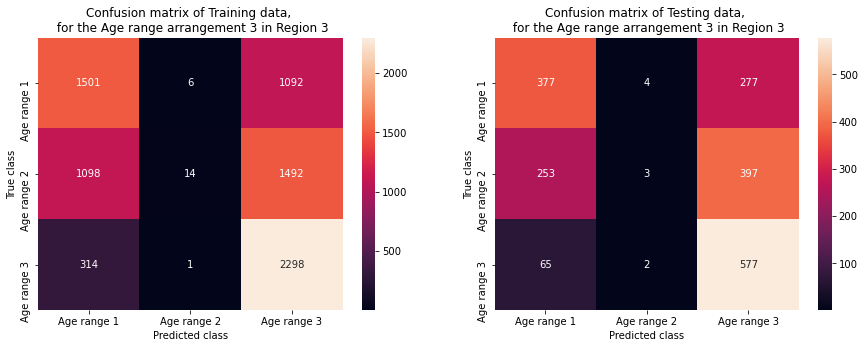

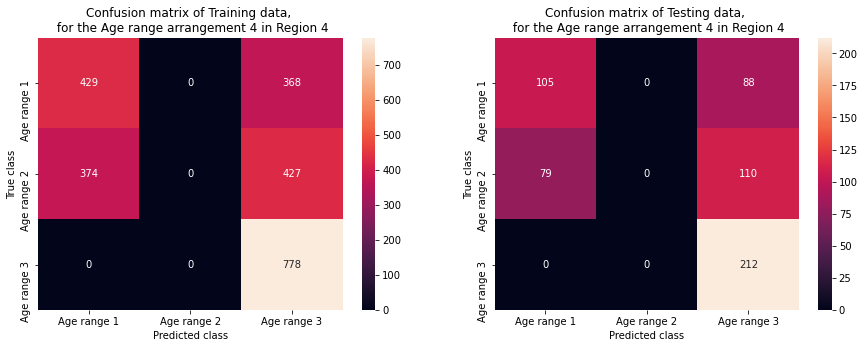

In [27]:
#once we have the best hyperparameters, lets see the classification report and confusion matrix,
#for a better understanding of how the model is doing.

#hyperparameters for the four regions
age_intervals=[[[18,30],[31,60],[61,100]],
               [[18,30],[31,60],[61,100]],
               [[18,30],[31,60],[61,100]],
               [[18,40], [41,59],[60, 100]]]
#for all cases the option [[18,30],[31,60],[61,100]] was the best, except in the region 4
#we chose decision tree for all cases
age_arrangement=[1,1,1,3]
max_depths=[3,10,2,2]


for i,region in enumerate([1,2,3,4]):
    
    print("\n REGION ", region,"\n ------------------------------------------------ \n")
    
    labels_name=[]
    interval=age_intervals[i]
    #data preprocessing
    data_aux=data.loc[data["region"]==region].copy()
    for p,m in enumerate(interval):
        data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1
        labels_name.append(f"Age range {p+1}")

    data_aux["age_range"]=data_aux["age_range"].astype("int")

    #check if there is any NaN in the "age_range" column
    if data_aux["age_range"].isnull().values.any():
        print(f"Error, some ages were not assigned an interval. Intervalos: {i}")
        print(data_aux.loc[data_aux["age_range"].isnull()])
        break
    else:
        print("All good, all ages were assigned an interval")
        colname=data_aux.columns.values

    #here is where I apply undersampling for having as much elements as the one that has less
    minumum=np.amin(data_aux["age_range"].value_counts())
    for p,m in enumerate(interval):
        data_aux=data_aux.drop(data_aux.loc[data_aux["age_range"]==p+1].index[minumum:])

    x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount"]],
                                               data_aux["age_range"],test_size=0.2)

    #build the model
    tree1=DecisionTreeClassifier(max_depth=max_depths[i])

    
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    tree1.fit(x_train,y_train)
    #we do the evaluation on the training data first
    y_predict=tree1.predict(x_train)
    conf=confusion_matrix(y_train.to_numpy(),y_predict)
    sns.heatmap(conf,annot=True,fmt="d",xticklabels=labels_name,
                yticklabels=labels_name)
    plt.title(f"Confusion matrix of Training data, \n for the Age range arrangement {i+1} in Region {region}")
    plt.ylabel("True class")
    plt.xlabel("Predicted class")

    report=classification_report(y_train.to_numpy(),y_predict,target_names=labels_name,zero_division=0)
    print(f"Report on Training data for the Age range arrangement {age_arrangement[i]} -> {str(interval)} \n",report)

    plt.subplot(1,2,2)
    #we do the evaluation on the training data first
    y_predict=tree1.predict(x_test)
    conf=confusion_matrix(y_test.to_numpy(),y_predict)
    sns.heatmap(conf,annot=True,fmt="d",xticklabels=labels_name,
                yticklabels=labels_name)
    plt.title(f"Confusion matrix of Testing data, \n for the Age range arrangement {i+1} in Region {region}")
    plt.ylabel("True class")
    plt.xlabel("Predicted class")

    report=classification_report(y_test.to_numpy(),y_predict,target_names=labels_name,zero_division=0)
    print(f"Report on Testing data for the Age range arrangement {age_arrangement[i]} -> {str(interval)} \n",report)


On these results we still see many problems, misclassifications and how the models tend to ignore one of the classification classes. This is probably due to the inability of the model to detect any patters among the variables we give to it. Hence it does not seems feasible a model that predicts the age range, even for the regions separately (we have done assumptions about the age intervals and maybe with other choices, the results could change).

### Second model: Predict the channel (online, in-store) based on other variables

In this model the dependent variable will be the channel of the transaction (online, in-store).  
We will attempt to predict it based on the other variables.

Fortunately, the data for this case is well-balanced.

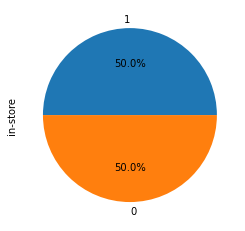

In [28]:
data["in-store"].value_counts().plot.pie(autopct='%1.1f%%');

As in the **first model**, I will try different learning algorithms, and different hyperparameters for them. Also, I will explore some possibilities in discretization for age (we have already did it), and amount.  
Although the "items", played no rule in the last model, I'm including it again.  

Finally, relative to the use of dummie variables, I'll try again both cases,with and without using dummie variables ,to ensure if it can enhance the performance. 

In [29]:
#the code for this model is very similar to the first model, just changing the dependent variables and 
#a few more things

#preproccess data

#data discretization

#the age will be discretized in two different ways.
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]

#the amount will be discretized also, in two different arrangements
amount_intervals=[[[0,500],[500,1000],[1000,1500],[1500,2000],[2000,2500],[2500,3000],[3000,4000]]]


#I build a loop for each discretization

#Inside it, I build a grid search for the parameters I want to change in the algorithms
#For now i consider the data of all regions all together.
parameters_DT={"max_depth":[4,5,7,10,11,12,13,15],"max_features":(None,"auto")}
parameters_RF={"n_estimators":[5,10,25,35,50],"max_depth":[2,3,4,5,7]}
parameters_GB={"n_estimators":[10,30,50,100]}

#those lists are for saving the results for each age-interval loop
tune_DT={}
tune_RF={}
tune_GB={}

age_dummie_labels=[]
amount_dummie_labels=[]
results=pd.DataFrame()
#loop trough the interval age-amount arrangements
for i,age_interval in enumerate(age_intervals):
    for j,amount_interval in enumerate(amount_intervals):
        #use a copy 
        data_aux=data.copy()

        #discretize in intervals
        #discretize age
        for p,m in enumerate(age_interval):
            data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1
            age_dummie_labels.append(f"age_range_{p+1}")
        #change to intiger the age_range value    
        data_aux["age_range"]=data_aux["age_range"].astype("int")

        #discretize amount
        for p,m in enumerate(amount_interval):
            data_aux.loc[(data_aux["amount"]>=m[0])&(data_aux["amount"]<=m[1]),"amount_range"]=p+1
            amount_dummie_labels.append(f"amount_range_{p+1}")

        #change to intiger the amount_range value    
        data_aux["amount_range"]=data_aux["amount_range"].astype("int")


        #check if there is any NaN in the "age_range" column
        if data_aux.loc[:,["age_range","amount_range"]].isnull().values.any():
            print(f"Error, some ages were not assigned an interval. Intervalos: age-->{i+1} and amount-->{j+1}")
            print(data_aux.loc[:,["age_range","amount_range"]].isnull())
            break
        else:
            print("All good, all ages and amounts were assigned an interval")
            colname=data_aux.columns.values

        #create dummie variables
        data_aux=data_aux.join(pd.get_dummies(data_aux.region,"region"))
        data_aux=data_aux.join(pd.get_dummies(data_aux["age_range"],"age_range"))
        data_aux=data_aux.join(pd.get_dummies(data_aux["amount_range"],"amount_range"))


        #do a loop for using dummie variables, and for not using them
        for text_dummie in ['dummie','not_dummie_discret','not_dummie_not_discret']:

            #now split the data, the train will be used for tuning, and the test, for testing the last best model
            if text_dummie=="dummie":
                # use dummie variables
                
                #join all the dummie variable labels
                labels_aux=["items","region_1","region_2",
                            "region_3","region_4"]+age_dummie_labels+amount_dummie_labels

                #split the data
                x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,labels_aux],
                                                               data_aux["in-store"],test_size=0.2)
            elif text_dummie=='not_dummie_discret':                
                
                #split the data
                x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["items","amount_range"
                                                                               ,"region","age_range"]],
                                                               data_aux["in-store"],test_size=0.2)

            elif text_dummie=='not_dummie_not_discret':
                #also, we can use discretization or ignore ir and use amount and age without discretization
                
                #split the data
                x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["items","amount","region","age"]],
                                                               data_aux["in-store"],test_size=0.2)

                
            #build the models and the gridsearch instances
            #the search is made using crossvalidation, with 5 folds
            tree1=DecisionTreeClassifier()
            forest=RandomForestClassifier()
            boost=GradientBoostingClassifier()
            tree_search=GridSearchCV(tree1,parameters_DT)
            forest_search=GridSearchCV(forest,parameters_RF)
            boost_search=GridSearchCV(boost,parameters_GB)

            #give the data for cross validation search of best hyperparameters
            tree_search.fit(x_train,y_train)
            forest_search.fit(x_train,y_train)
            boost_search.fit(x_train,y_train)

            #we add all the results into a dataframe 
            aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],"Amount interval":[j],
                                   "Algorithm":["tree"],"best params":[tree_search.best_params_],
                                   "score":[tree_search.best_score_]})
            results=results.append(aux)
            aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],"Amount interval":[j],
                                   "Algorithm":["forest"],"best params":[forest_search.best_params_],
                                   "score":[tree_search.best_score_]})
            results=results.append(aux)
            aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],"Amount interval":[j],
                                   "Algorithm":["GradBoost"],"best params":[boost_search.best_params_],
                                   "score":[tree_search.best_score_]})
            results=results.append(aux)
            #NOT NEEDED, I PRINT THEM IN A DATAFRAME <-- print the best results
            #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j,". Tree: ",tree_search.best_params_," with score: ",tree_search.best_score_)
            #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j," Forest: ",forest_search.best_params_," with score: ",forest_search.best_score_)
            #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j,". GradBoost: ",boost_search.best_params_," with score: ",boost_search.best_score_)
            #with tree_search.cv_results_, we could serach for further information in the results

            #now we save this for later analysis
            tune_DT[f"age_{i}_amount_{j}_{text_dummie}"]=tree_search
            tune_RF[f"age_{i}_amount_{j}_{text_dummie}"]=forest_search
            tune_GB[f"age_{i}_amount_{j}_{text_dummie}"]=boost_search
results.sort_values("score")

All good, all ages and amounts were assigned an interval
All good, all ages and amounts were assigned an interval
All good, all ages and amounts were assigned an interval


,Dummie var,Age intreval,Amount interval,Algorithm,best params,score
0,not_dummie_discret,0,0,tree,"{'max_depth': 7, 'max_features': None}",0.870606
0,not_dummie_discret,0,0,forest,"{'max_depth': 7, 'n_estimators': 5}",0.870606
0,not_dummie_discret,0,0,GradBoost,{'n_estimators': 50},0.870606
0,dummie,0,0,tree,"{'max_depth': 13, 'max_features': 'auto'}",0.870638
0,dummie,0,0,forest,"{'max_depth': 7, 'n_estimators': 50}",0.870638
0,dummie,0,0,GradBoost,{'n_estimators': 100},0.870638
0,not_dummie_discret,1,0,GradBoost,{'n_estimators': 50},0.872607
0,not_dummie_discret,1,0,tree,"{'max_depth': 7, 'max_features': None}",0.872607
0,not_dummie_discret,1,0,forest,"{'max_depth': 7, 'n_estimators': 5}",0.872607
0,dummie,1,0,tree,"{'max_depth': 10, 'max_features': None}",0.872622


We found the best hyperparameters and data proprocessing for our model. Now lets build the model and test it.  
We proceed with the tree learning algorithm because of its readability.

I would like to highlight how the accuracy from all three learning algorithms is always the same for the best performances, given the same discretization.

In [30]:
#lets train the final model we choose, and test it in the test data
data_aux=data.copy()

#no need to discretize in intervals 

#split the data
x_train,x_test,y_train,y_test=train_test_split(data.loc[:,["items","amount","region","age"]],
                                               data["in-store"],test_size=0.2)

#create and train the model
final_model_channel=DecisionTreeClassifier(max_depth= 10, max_features= None)
final_model_channel.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=10)

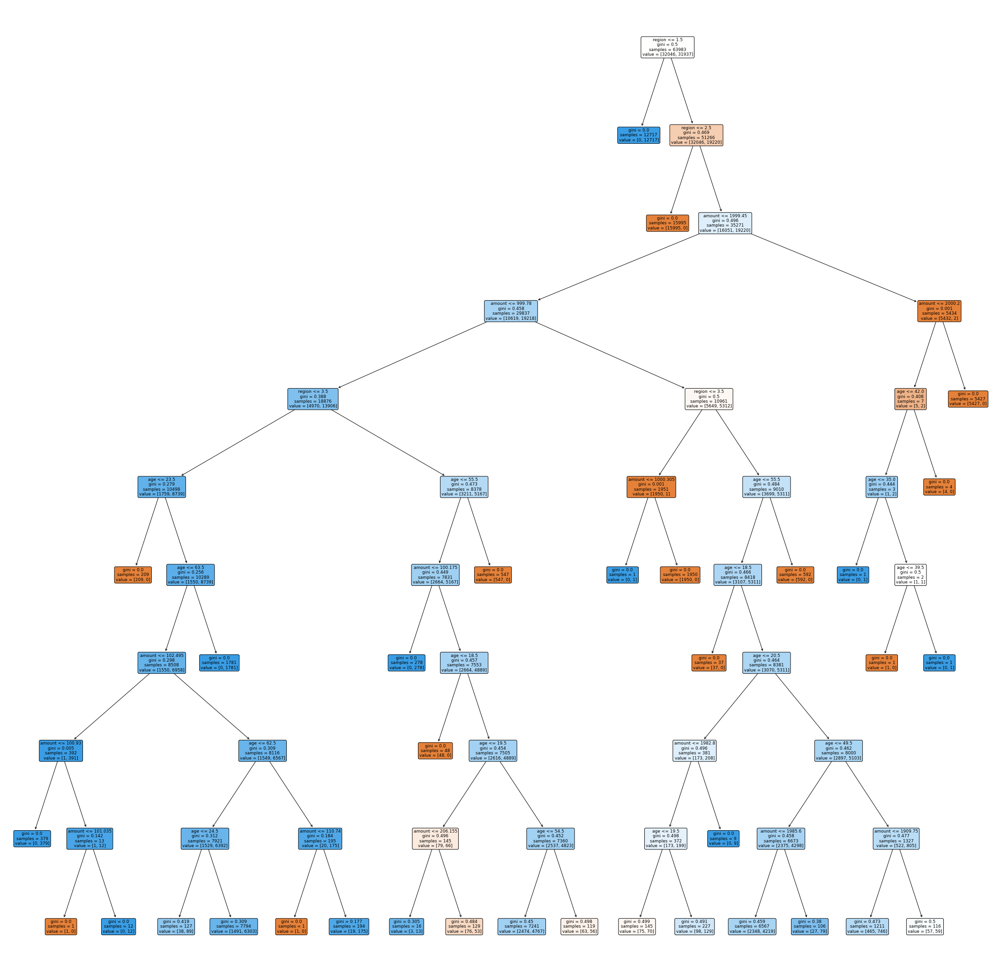

In [31]:
#the final model tree looks like
plt.figure(figsize=(38,38))
plot_tree(final_model_channel,filled=1,rounded=1,feature_names=["items","amount","region","age"],fontsize=9);
plt.savefig("tree.jpg")

The image has not a very good resolution, but if we zoom in, we can see how it reaches a pretty high level of detail, which could be due to overfitting, however, we should wait for the evaluation on test-data, before any conclusions.

In [32]:
text_representation = export_text(final_model_channel)
print(text_representation)

|--- feature_2 <= 1.50
|   |--- class: 1
|--- feature_2 >  1.50
|   |--- feature_2 <= 2.50
|   |   |--- class: 0
|   |--- feature_2 >  2.50
|   |   |--- feature_1 <= 1999.45
|   |   |   |--- feature_1 <= 999.78
|   |   |   |   |--- feature_2 <= 3.50
|   |   |   |   |   |--- feature_3 <= 23.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_3 >  23.50
|   |   |   |   |   |   |--- feature_3 <= 63.50
|   |   |   |   |   |   |   |--- feature_1 <= 102.50
|   |   |   |   |   |   |   |   |--- feature_1 <= 100.93
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- feature_1 >  100.93
|   |   |   |   |   |   |   |   |   |--- feature_1 <= 101.03
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- feature_1 >  101.03
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |--- feature_1 >  102.50
|   |   |   |   |   |   |   |   |--- feature_3 <= 62.50
|   |   |   |   |   

In [33]:
final_model_channel.feature_importances_

array([0.        , 0.21604336, 0.72153884, 0.0624178 ])

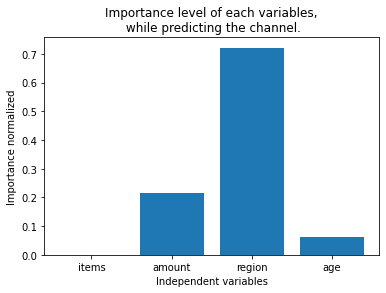

In [34]:
plt.bar([1,2,3,4],final_model_channel.feature_importances_,tick_label=["items","amount","region","age"])
plt.ylabel("Importance normalized")
plt.xlabel("Independent variables")
plt.title("Importance level of each variables,\n while predicting the channel.");

From this atritube we get from our model "feature\_importances\_", we can see how items plays almost no roll at all in the splitting (items are only used once), and the region is the most important (becaus of the two regions which only have one type "online" or "in-store", many classification was done there). It is followed by the amount, because if we remember, some amount were bought only via "online". (see graph below)

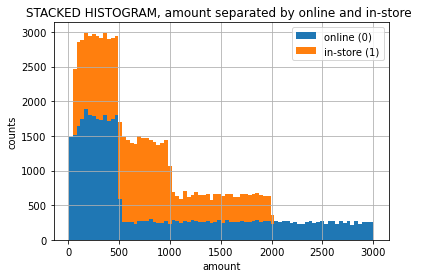

In [35]:
#total amount in all regions separated by online and in-store
plt.grid()
plt.title("STACKED HISTOGRAM, amount separated by online and in-store ")
a=plt.hist([data.loc[data["in-store"]==0,"amount"].to_numpy(),
            data.loc[data["in-store"]==1,"amount"].to_numpy()],
           80, histtype='bar', stacked=True,label=["online (0)","in-store (1)"])
plt.legend()
plt.ylabel("counts");
plt.xlabel("amount");

              precision    recall  f1-score   support

      online       0.99      0.78      0.87     32046
    in-store       0.82      0.99      0.90     31937

    accuracy                           0.89     63983
   macro avg       0.91      0.89      0.89     63983
weighted avg       0.91      0.89      0.89     63983



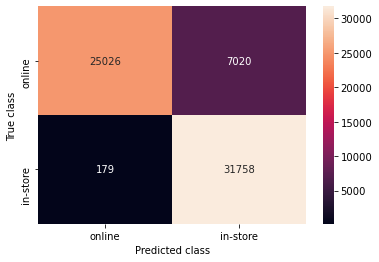

In [36]:
#evaluate with different metrics and the confusion matrix

#in train data
y_predict=final_model_channel.predict(x_train)
#get confusion matrix
conf=confusion_matrix(y_train.to_numpy(),y_predict)
#plot confusion matrix
sns.heatmap(conf,annot=True,fmt="d",xticklabels=["online","in-store"],yticklabels=["online","in-store"])
plt.ylabel("True class")
plt.xlabel("Predicted class")

report1=classification_report(y_train.to_numpy(),y_predict,target_names=["online","in-store"])
print(report1)


              precision    recall  f1-score   support

      online       0.99      0.78      0.88      7943
    in-store       0.82      0.99      0.90      8053

    accuracy                           0.89     15996
   macro avg       0.91      0.89      0.89     15996
weighted avg       0.91      0.89      0.89     15996



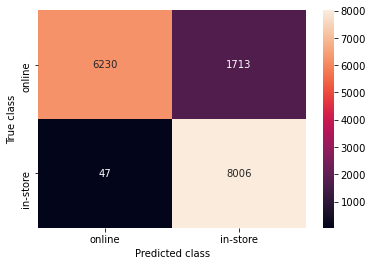

In [37]:
#in test data (this is really the important part, however, caomparing it with the results from training data, 
#              we could detect things like over-fitting)
y_predict=final_model_channel.predict(x_test)
#get confusion matrix
conf=confusion_matrix(y_test.to_numpy(),y_predict)
#plot confusion matrix
sns.heatmap(conf,annot=True,fmt="d",xticklabels=["online","in-store"],yticklabels=["online","in-store"])
plt.ylabel("True class")
plt.xlabel("Predicted class")

report2=classification_report(y_test.to_numpy(),y_predict,target_names=["online","in-store"])
print(report2)

For this model, after analyzing the metrics from the "classification report", and the confusion matrix, we can see how the performance is much better for this classification, than in the case of age_range classification.    
Here not only we have a high accuracy, but precision and recall also show that the classification model is reliable.   
And we don't only have good results in the training data, but also in the testing data, which has never seen before.  
It seemed from the DecisionTree plot, because of the detail in the classifications, that it could be overfitting, but when applying the model to unseen data, the performance was almost identical.  
I only see two possible explanations:
1. The data really has some detailed / hidden structure, and the decision tree has found it.
2. All the data from the sample has the same strange structure, and this detailed DecisionTree fits well all data (train and test sets) because it shares the same errors.


Remember that we have done the hyperparameters choice based on the best accuracy score, however, we could have chosen many others metrics, this is something to keep in mind while tuning hyperparameters. For example, maybe we want our model to have very little False Positives (high precision), and the accuracy is not our priority.

To improve the performance we could check what is missing in the model, which common characteristics share the misclassified data (those False In-store and False Online).

In [38]:
#lets analyze the cases of false in-store
y_predict=final_model_channel.predict(x_test)
y_test_np=y_test.to_numpy()
error_data=x_test.loc[y_predict!=y_test_np]
false_instore=x_test.loc[(y_predict!=y_test_np)&(y_predict==1)]
false_online=x_test.loc[(y_predict!=y_test_np)&(y_predict==0)]

Distribution plots for all of the missclasified data.

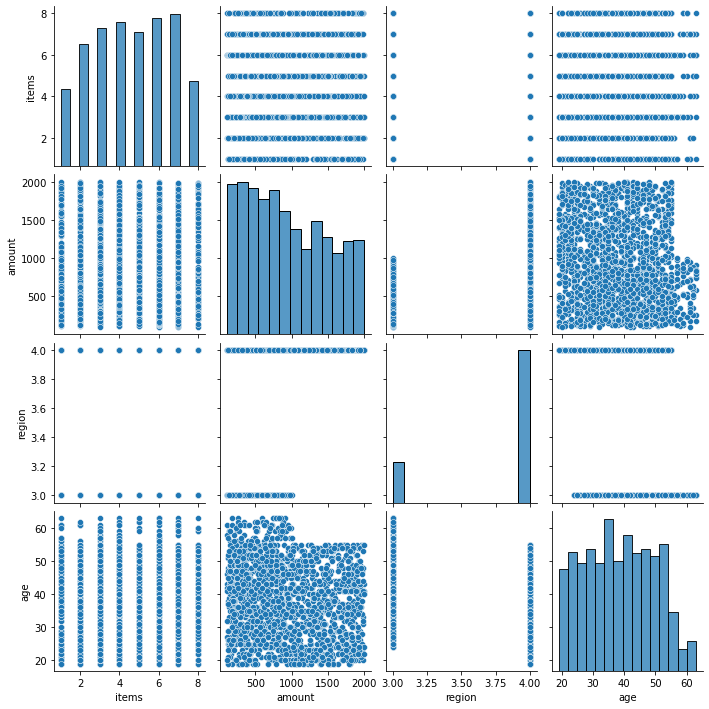

In [39]:
sns.pairplot(error_data)

Distribution plots for the data missclasified  as "in-store"

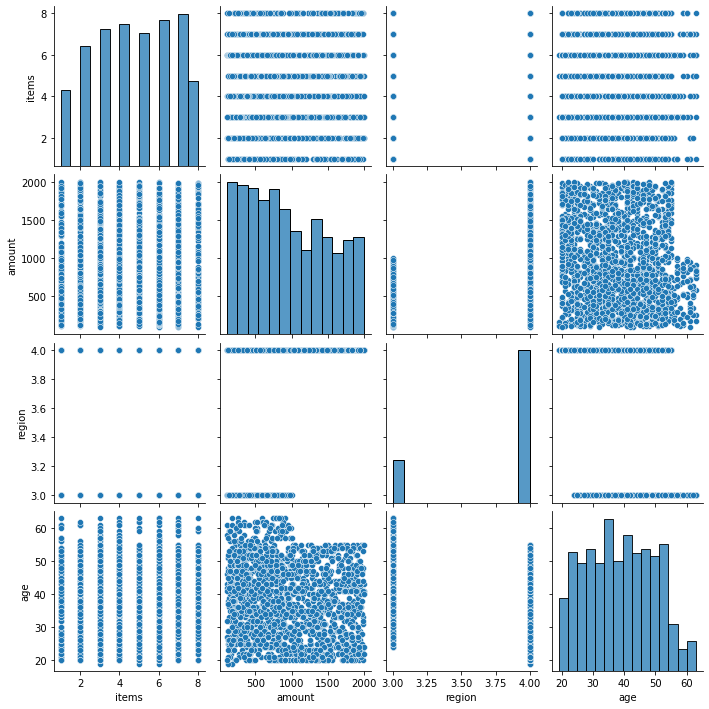

In [40]:
sns.pairplot(false_instore)

Distribution plots for the data missclasified  as "online"

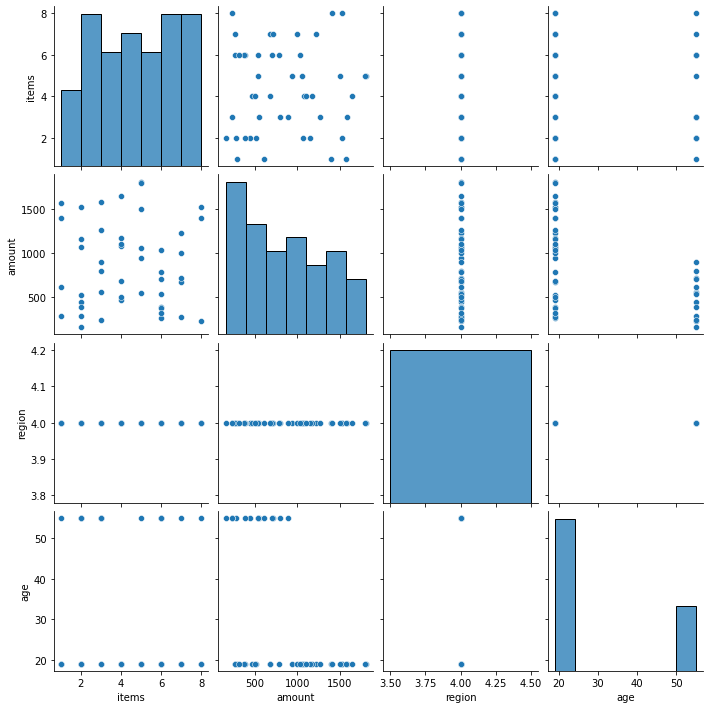

In [41]:
sns.pairplot(false_online)

From last histograms and scatter plots, we can see how the misclassification happened for regions 3 and 4 (more on region 4), this is totally normal since only in those regions we have online and in-store together. 

The errors in false online classification, happened for ages ~20 years and a few more ~55 years.


At first glance I couldn't tell more obvious common features, however, because we have the data that was missclasified, then we could try to build and run a model in that data, to see if a learning algorithm can insight something deeper about the data. Or we could try other strategies to fix the model missclasifications, maybe adding an extralayer for testing the results, or combine multiple learning algorithms and make an ensemble where each algorithm is very good in one specific task, but all together are good in general (a single algorithm couldn't do that --> No free lunch theorem).

# <ins>5- QUESTIONS answered</ins>

In this section I'll summarize the answers to the e-mail Daniel sent.


#### From the e-mail: 
Extacted from the e-mail:  
* *... Martin Goodrich thinks that **customers who shop in the store are older than customers who shop online** and that **older people spend more money on electronics than younger people**...changes to the website to attract older buyers.*  
<span style="color:blue">Brief answer: We found that only in region 2, old people (>60 years) spend as much money as intermediate age (between 30 and 60), but not more. In any other case, old people do not spend more than young ones (usually less). (see pie charts above) This is of course, taking into account the age intervals [18-30],[30,60] and [60,100]</span>.

  
  
* ... *gain insight into any **factors that can better understand the age of our customers** and if **it correlates with how much they spend**...*  
<span style="color:blue">Brief answer: We haven't found in our data sample, any correlation between age and amount. The best treatment we found so far for a better understanding on the ages of customers, was splitting **for each region**, the amount spend in the different age interals we have used. (figure with four pie-charts above in this report) </span>.

 
  
* Infer any insights about customer purchasing behavior:
    1. *Are there **differences in the age of customers between regions?** If so, can we predict the age of a customer in a region based on other demographic data?*
    2. *We need to investigate Martin’s hypothesis: Is there any **correlation between age of a customer and if the transaction was made online or in the store**? Do any **other factors predict if a customer will buy online or in our stores?** *
      
<span style="color:blue">1. Brief answer: There is a slight change on the age distribution between regions, it is clearly visible on the pie-charts above, however this does not mean anything about a possible correlation between region and age, there are just slight variations on the age distributions in each region. The use of a model to predict the age taking into acount all four regions together, proved to be unfeasible, because of the littel robustness and the inhability of the algorithms to find deep relations between variables (those were almost random decisions).  And for the prediction of age in each regions separately, we have found very similar results. The models were not capable of founding any deep relation among variables, therefore the classification was very random and little robust.</span>

    
<span style="color:blue">2. Brief answer:  The model for channel prediction, showed a good performance. And, although it must be monitorized with new data (to probe that it is not overfitting defective data), the model seems to work well because it gave good and similar results both, with training and testing dataset. Reaching a 88.9% of accuracy, and good values on other metrics (precision, recall) as well. </span>.
     
     
**(For full explanations, and detailed results, read the all the report, which explains the results right below each code-cell)**

# <ins>6- Final conclusions</ins>



Since we are working with a sample of data, and we don't have access to the whole population, the possible hypothesis testing or the conclusions that we draw from the data should be taken carefully. If I had access to more information about how the data was taken, or more information about the population etc... I could probably do more statistical inference, but since this data has no context, the conclusions we found, are only valid for the sample. 


I will like to ask for more information about: The way the data was taken, as well as a time variable for future data, it can help enormously in many aspects to the data analysis process.


# <ins>7- Appendix</ins>

In this last/extra section, I will build the models for amount and region predictions.  
I wrote this section separately because it is not really asked in the e-mail from Daniel, and it was only suggested in the POA.


#### Predict the region

For the trainig with region as dependent variable, we have a well balanced data.


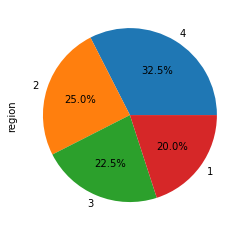

In [42]:
data["region"].value_counts().plot.pie(autopct='%1.1f%%');

In [43]:
#model for prediccticting the region

#preproccess data

#data discretization

#the age will be discretized in two different ways.
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]

#the amount will be discretized also, in two different arrangements
amount_intervals=[[[0,500],[500,1000],[1000,1500],[1500,2000],[2000,2500],[2500,3000],[3000,4000]]]


#I build a loop for each discretization

#Inside it, I build a grid search for the parameters I want to change in the algorithms
#For now i consider the data of all regions all together.
parameters_DT={"max_depth":[2,3,4,5,7,10,11,12,13,15],"max_features":(None,"auto")}
parameters_RF={"n_estimators":[5,10,25,35,50],"max_depth":[2,3,4,5,7]}
parameters_GB={"n_estimators":[10,30,50,100]}

#those lists are for saving the results for each age-interval loop
tune_DT={}
tune_RF={}
tune_GB={}

age_dummie_labels=[]
amount_dummie_labels=[]
results=pd.DataFrame()
#loop trough the interval age-amount arrangements
for i,age_interval in enumerate(age_intervals):
    for j,amount_interval in enumerate(amount_intervals):
        #use a copy 
        data_aux=data.copy()

        #discretize in intervals
        #discretize age
        for p,m in enumerate(age_interval):
            data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1
            age_dummie_labels.append(f"age_range_{p+1}")
        #change to intiger the age_range value    
        data_aux["age_range"]=data_aux["age_range"].astype("int")

        #discretize amount
        for p,m in enumerate(amount_interval):
            data_aux.loc[(data_aux["amount"]>=m[0])&(data_aux["amount"]<=m[1]),"amount_range"]=p+1
            amount_dummie_labels.append(f"amount_range_{p+1}")

        #change to intiger the amount_range value    
        data_aux["amount_range"]=data_aux["amount_range"].astype("int")


        #check if there is any NaN in the "age_range" column
        if data_aux.loc[:,["age_range","amount_range"]].isnull().values.any():
            print(f"Error, some ages were not assigned an interval. Intervalos: age-->{i+1} and amount-->{j+1}")
            print(data_aux.loc[:,["age_range","amount_range"]].isnull())
            break
        else:
            print("All good, all ages and amounts were assigned an interval")
            colname=data_aux.columns.values

        #create dummie variables
        data_aux=data_aux.join(pd.get_dummies(data_aux["age_range"],"age_range"))
        data_aux=data_aux.join(pd.get_dummies(data_aux["amount_range"],"amount_range"))


        #do a loop for using dummie variables, and for not using them
        for text_dummie in ['dummie','not_dummie_discret','not_dummie_not_discret']:

            #now split the data, the train will be used for tuning, and the test, for testing the last best model
            if text_dummie=="dummie":
                # use dummie variables
                
                #join all the dummie variable labels
                labels_aux=["in-store","items"]+age_dummie_labels+amount_dummie_labels

                #split the data
                x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,labels_aux],
                                                               data_aux["region"],test_size=0.2)
            elif text_dummie=='not_dummie_discret':                
                
                #split the data
                x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount_range"
                                                                               ,"age_range"]],
                                                               data_aux["region"],test_size=0.2)

            elif text_dummie=='not_dummie_not_discret':
                #also, we can use discretization or ignore ir and use amount and age without discretization
                
                #split the data
                x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount","age"]],
                                                               data_aux["region"],test_size=0.2)

                
            #build the models and the gridsearch instances
            #the search is made using crossvalidation, with 5 folds
            tree1=DecisionTreeClassifier()
            forest=RandomForestClassifier()
            boost=GradientBoostingClassifier()
            tree_search=GridSearchCV(tree1,parameters_DT)
            forest_search=GridSearchCV(forest,parameters_RF)
            boost_search=GridSearchCV(boost,parameters_GB)

            #give the data for cross validation search of best hyperparameters
            tree_search.fit(x_train,y_train)
            forest_search.fit(x_train,y_train)
            boost_search.fit(x_train,y_train)

            #we add all the results into a dataframe 
            aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],"Amount interval":[j],
                                   "Algorithm":["tree"],"best params":[tree_search.best_params_],
                                   "score":[tree_search.best_score_]})
            results=results.append(aux)
            aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],"Amount interval":[j],
                                   "Algorithm":["forest"],"best params":[forest_search.best_params_],
                                   "score":[tree_search.best_score_]})
            results=results.append(aux)
            aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],"Amount interval":[j],
                                   "Algorithm":["GradBoost"],"best params":[boost_search.best_params_],
                                   "score":[tree_search.best_score_]})
            results=results.append(aux)
            #NOT NEEDED, I PRINT THEM IN A DATAFRAME <-- print the best results
            #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j,". Tree: ",tree_search.best_params_," with score: ",tree_search.best_score_)
            #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j," Forest: ",forest_search.best_params_," with score: ",forest_search.best_score_)
            #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j,". GradBoost: ",boost_search.best_params_," with score: ",boost_search.best_score_)
            #with tree_search.cv_results_, we could serach for further information in the results

            #now we save this for later analysis
            tune_DT[f"age_{i}_amount_{j}_{text_dummie}"]=tree_search
            tune_RF[f"age_{i}_amount_{j}_{text_dummie}"]=forest_search
            tune_GB[f"age_{i}_amount_{j}_{text_dummie}"]=boost_search
results.sort_values("score")

All good, all ages and amounts were assigned an interval
All good, all ages and amounts were assigned an interval
All good, all ages and amounts were assigned an interval


,Dummie var,Age intreval,Amount interval,Algorithm,best params,score
0,not_dummie_discret,2,0,GradBoost,{'n_estimators': 100},0.631511
0,not_dummie_discret,2,0,forest,"{'max_depth': 4, 'n_estimators': 50}",0.631511
0,not_dummie_discret,2,0,tree,"{'max_depth': 4, 'max_features': None}",0.631511
0,dummie,0,0,tree,"{'max_depth': 5, 'max_features': None}",0.632434
0,dummie,0,0,forest,"{'max_depth': 7, 'n_estimators': 35}",0.632434
0,dummie,0,0,GradBoost,{'n_estimators': 50},0.632434
0,dummie,2,0,GradBoost,{'n_estimators': 50},0.633059
0,dummie,2,0,forest,"{'max_depth': 5, 'n_estimators': 50}",0.633059
0,dummie,2,0,tree,"{'max_depth': 5, 'max_features': None}",0.633059
0,not_dummie_discret,1,0,GradBoost,{'n_estimators': 100},0.633997


   Lets build, train an test the model for the best results we found. --> no use of dummie variables, no use of discretization, DecisionTree as learning algorithm (we chose it because of its readability), max_depth=5 and max_feature=None

              precision    recall  f1-score   support

    Region 1       0.41      0.53      0.46      3236
    Region 2       0.90      1.00      0.95      4033
    Region 3       0.53      0.22      0.31      3529
    Region 4       0.64      0.73      0.68      5198

    accuracy                           0.64     15996
   macro avg       0.62      0.62      0.60     15996
weighted avg       0.64      0.64      0.62     15996



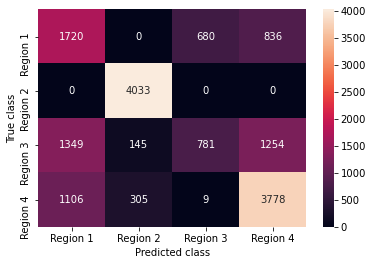

In [44]:
data_aux=data.copy()

#best results has no need to discretize in intervals or dummie variables

#split data
x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","amount","age"]],
                                               data_aux["region"],test_size=0.2)
#build model
tree1=DecisionTreeClassifier(max_depth=5)
#train model
tree1.fit(x_train,y_train)
#predict data
y_predict=tree1.predict(x_test)
#test model
conf=confusion_matrix(y_test.to_numpy(),y_predict)
sns.heatmap(conf,annot=True,fmt="d",xticklabels=["Region 1","Region 2","Region 3","Region 4"],
            yticklabels=["Region 1","Region 2","Region 3","Region 4"])
plt.ylabel("True class")
plt.xlabel("Predicted class")

report2=classification_report(y_test.to_numpy(),
                              y_predict,target_names=["Region 1","Region 2","Region 3","Region 4"])
print(report2)


From the confusion matrix and the different metrics, we can say that region 2 is very distinguishable from the others, since all of them were correctly classified (recall=1), although we had some misclassification (precision not =1, but =90%). Region 4 also had more or less "good" results, and expect region 3, the results were better than a random choice between the four regions (this would be a very simple baseline though).

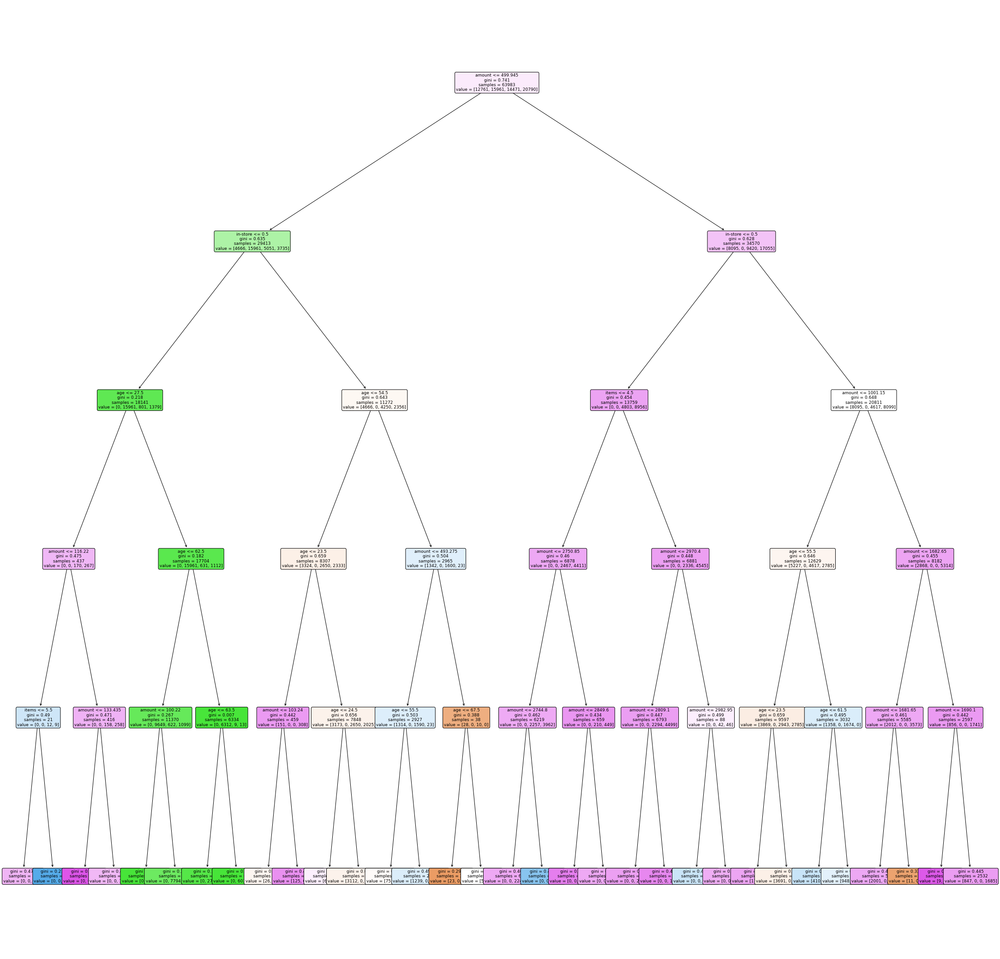

In [45]:
#the final model tree looks like
plt.figure(figsize=(38,38))
plot_tree(tree1,filled=1,rounded=1,feature_names=["in-store","items","amount","age"],fontsize=9);
#plt.savefig("tree.jpg")

#### Predict the amount

Lets see if out data is well balanced with out amount discretization.


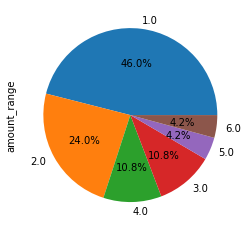

In [46]:
amount_interval=[[0,500],[500,1000],[1000,1500],[1500,2000],[2000,2500],[2500,3300]]
data_aux=data.copy()

for p,m in enumerate(amount_interval):
    data_aux.loc[(data_aux["amount"]>=m[0])&(data_aux["amount"]<=m[1]),"amount_range"]=p+1

data_aux["amount_range"].value_counts().plot.pie(autopct='%1.1f%%');

In this case, we have clearly imbalanced dataset to work with. Almos the half of it is from the range 0-500 and almost a quarter is from 500-1000.


In [47]:
#the code for this model is very similar to the first model, just changing the dependent variables and 
#a few more things

#preproccess data

#data discretization

#the age will be discretized in two different ways.
age_intervals=[[[18,30],[31,60],[61,100]],
              [[18,40], [41,59],[60, 100]],
              [[18,35],[36,49],[50,64],[65,100]]]

#the amount will be discretized also, in two different arrangements
amount_intervals=[[[0,500],[500,1000],[1000,1500],[1500,2000],[2000,2500],[2500,3300]]]


#I build a loop for each discretization

#Inside it, I build a grid search for the parameters I want to change in the algorithms
#For now i consider the data of all regions all together.
parameters_DT={"max_depth":[2,3,4,5,7,10,11,12,13,15],"max_features":(None,"auto")}
parameters_RF={"n_estimators":[5,10,25,35,50],"max_depth":[2,3,4,5,7]}
parameters_GB={"n_estimators":[10,30,50,100]}

#those lists are for saving the results for each age-interval loop
tune_DT={}
tune_RF={}
tune_GB={}

age_dummie_labels=[]
amount_dummie_labels=[]
results=pd.DataFrame()
#loop trough the interval age-amount arrangements
for i,age_interval in enumerate(age_intervals):
    #use a copy 
    data_aux=data.copy()

    #discretize in intervals
    #discretize age
    for p,m in enumerate(age_interval):
        data_aux.loc[(data_aux["age"]>=m[0])&(data_aux["age"]<=m[1]),"age_range"]=p+1
        age_dummie_labels.append(f"age_range_{p+1}")
    #change to intiger the age_range value    
    data_aux["age_range"]=data_aux["age_range"].astype("int")

    #discretize amount
    for p,m in enumerate(amount_interval):
        data_aux.loc[(data_aux["amount"]>=m[0])&(data_aux["amount"]<=m[1]),"amount_range"]=p+1


    #change to intiger the amount_range value    
    data_aux["amount_range"]=data_aux["amount_range"].astype("int")


    #check if there is any NaN in the "age_range" column
    if data_aux.loc[:,["age_range","amount_range"]].isnull().values.any():
        print(f"Error, some ages were not assigned an interval. Intervalos: age-->{i+1} and amount-->{j+1}")
        print(data_aux.loc[:,["age_range","amount_range"]].isnull())
        break
    else:
        print("All good, all ages and amounts were assigned an interval")
        colname=data_aux.columns.values

    #create dummie variables
    data_aux=data_aux.join(pd.get_dummies(data_aux.region,"region"))
    data_aux=data_aux.join(pd.get_dummies(data_aux["age_range"],"age_range"))


    #do a loop for using dummie variables, and for not using them
    for text_dummie in ['dummie','not_dummie_discret','not_dummie_not_discret']:

        #now split the data, the train will be used for tuning, and the test, for testing the last best model
        if text_dummie=="dummie":
            # use dummie variables

            #join all the dummie variable labels
            labels_aux=["in-store","items","region_1","region_2","region_3","region_4"]+age_dummie_labels

            #split the data
            x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,labels_aux],
                                                           data_aux["amount_range"],test_size=0.2)
        elif text_dummie=='not_dummie_discret':                

            #split the data
            x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items"
                                                                           ,"region","age_range"]],
                                                           data_aux["amount_range"],test_size=0.2)

        elif text_dummie=='not_dummie_not_discret':
            #also, we can use discretization or ignore ir and use amount and age without discretization

            #split the data
            x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","region","age"]],
                                                           data_aux["amount_range"],test_size=0.2)


        #build the models and the gridsearch instances
        #the search is made using crossvalidation, with 5 folds
        tree1=DecisionTreeClassifier()
        forest=RandomForestClassifier()
        boost=GradientBoostingClassifier()
        tree_search=GridSearchCV(tree1,parameters_DT)
        forest_search=GridSearchCV(forest,parameters_RF)
        boost_search=GridSearchCV(boost,parameters_GB)

        #give the data for cross validation search of best hyperparameters
        tree_search.fit(x_train,y_train)
        forest_search.fit(x_train,y_train)
        boost_search.fit(x_train,y_train)

        #we add all the results into a dataframe 
        aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],
                               "Algorithm":["tree"],"best params":[tree_search.best_params_],
                               "score":[tree_search.best_score_]})
        results=results.append(aux)
        aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],
                               "Algorithm":["forest"],"best params":[forest_search.best_params_],
                               "score":[tree_search.best_score_]})
        results=results.append(aux)
        aux=pd.DataFrame(data={"Dummie var":[text_dummie],"Age intreval":[i],
                               "Algorithm":["GradBoost"],"best params":[boost_search.best_params_],
                               "score":[tree_search.best_score_]})
        results=results.append(aux)
        #NOT NEEDED, I PRINT THEM IN A DATAFRAME <-- print the best results
        #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j,". Tree: ",tree_search.best_params_," with score: ",tree_search.best_score_)
        #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j," Forest: ",forest_search.best_params_," with score: ",forest_search.best_score_)
        #print(text_dummie,": Age intervals: ",i," Amount intervals: ",j,". GradBoost: ",boost_search.best_params_," with score: ",boost_search.best_score_)
        #with tree_search.cv_results_, we could serach for further information in the results

        #now we save this for later analysis
        tune_DT[f"age_{i}_{text_dummie}"]=tree_search
        tune_RF[f"age_{i}_{text_dummie}"]=forest_search
        tune_GB[f"age_{i}_{text_dummie}"]=boost_search
results.sort_values("score")

All good, all ages and amounts were assigned an interval
All good, all ages and amounts were assigned an interval
All good, all ages and amounts were assigned an interval


,Dummie var,Age intreval,Algorithm,best params,score
0,not_dummie_discret,2,GradBoost,{'n_estimators': 100},0.489271
0,not_dummie_discret,2,forest,"{'max_depth': 5, 'n_estimators': 10}",0.489271
0,not_dummie_discret,2,tree,"{'max_depth': 4, 'max_features': 'auto'}",0.489271
0,not_dummie_not_discret,1,GradBoost,{'n_estimators': 50},0.489521
0,not_dummie_not_discret,1,forest,"{'max_depth': 4, 'n_estimators': 50}",0.489521
0,not_dummie_not_discret,1,tree,"{'max_depth': 2, 'max_features': None}",0.489521
0,not_dummie_discret,0,tree,"{'max_depth': 3, 'max_features': None}",0.489724
0,not_dummie_discret,0,forest,"{'max_depth': 5, 'n_estimators': 5}",0.489724
0,not_dummie_discret,0,GradBoost,{'n_estimators': 50},0.489724
0,not_dummie_not_discret,2,GradBoost,{'n_estimators': 30},0.490146


   Lets build, train an test the model for the best results we found. --> no use of dummie variables, no use of discretization, DecisionTree as learning algorithm (we chose it because of its readability), max_depth=5 and max_feature=None.

                precision    recall  f1-score   support

Amount range 1       0.96      0.56      0.71      7379
Amount range 2       0.42      0.65      0.51      3880
Amount range 3       0.20      0.57      0.29      1692
Amount range 4       0.17      0.08      0.11      1688
Amount range 5       0.00      0.00      0.00       682
Amount range 6       0.00      0.00      0.00       675

      accuracy                           0.49     15996
     macro avg       0.29      0.31      0.27     15996
  weighted avg       0.58      0.49      0.49     15996



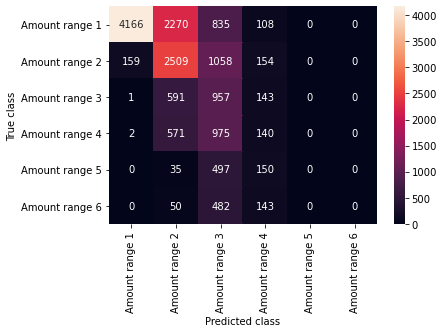

In [48]:
data_aux=data.copy()

#best results has no need to discretize in intervals or dummie variables
amount_interval=[[0,500],[500,1000],[1000,1500],[1500,2000],[2000,2500],[2500,3300]]
labels=[]
#discretize amount
for p,m in enumerate(amount_interval):
    data_aux.loc[(data_aux["amount"]>=m[0])&(data_aux["amount"]<=m[1]),"amount_range"]=p+1
    labels.append(f"Amount range {p+1}")

#change to intiger the amount_range value    
data_aux["amount_range"]=data_aux["amount_range"].astype("int")

#split data
x_train,x_test,y_train,y_test=train_test_split(data_aux.loc[:,["in-store","items","region","age"]],
                                               data_aux["amount_range"],test_size=0.2)
#build, train and test model
tree1=DecisionTreeClassifier(max_depth=5)
tree1.fit(x_train,y_train)
y_predict=tree1.predict(x_test)
conf=confusion_matrix(y_test.to_numpy(),y_predict)
#show results
sns.heatmap(conf,annot=True,fmt="d",xticklabels=labels,
            yticklabels=labels)
plt.ylabel("True class")
plt.xlabel("Predicted class")

report2=classification_report(y_test.to_numpy(),y_predict,target_names=labels,zero_division=0)
print(report2)


As expected from an imbalanced data, the results are not very good. The precision for Amount range 1 is high because it did few misclassifications, however, the recall was low because the model missed many.  
In the Amount range 2, the precision was very low, because the model misclassified many that were not, but the recall was higher because it missed few.  
For the other ranges, the classification was almost random, or even null for ranges 5 and 6.

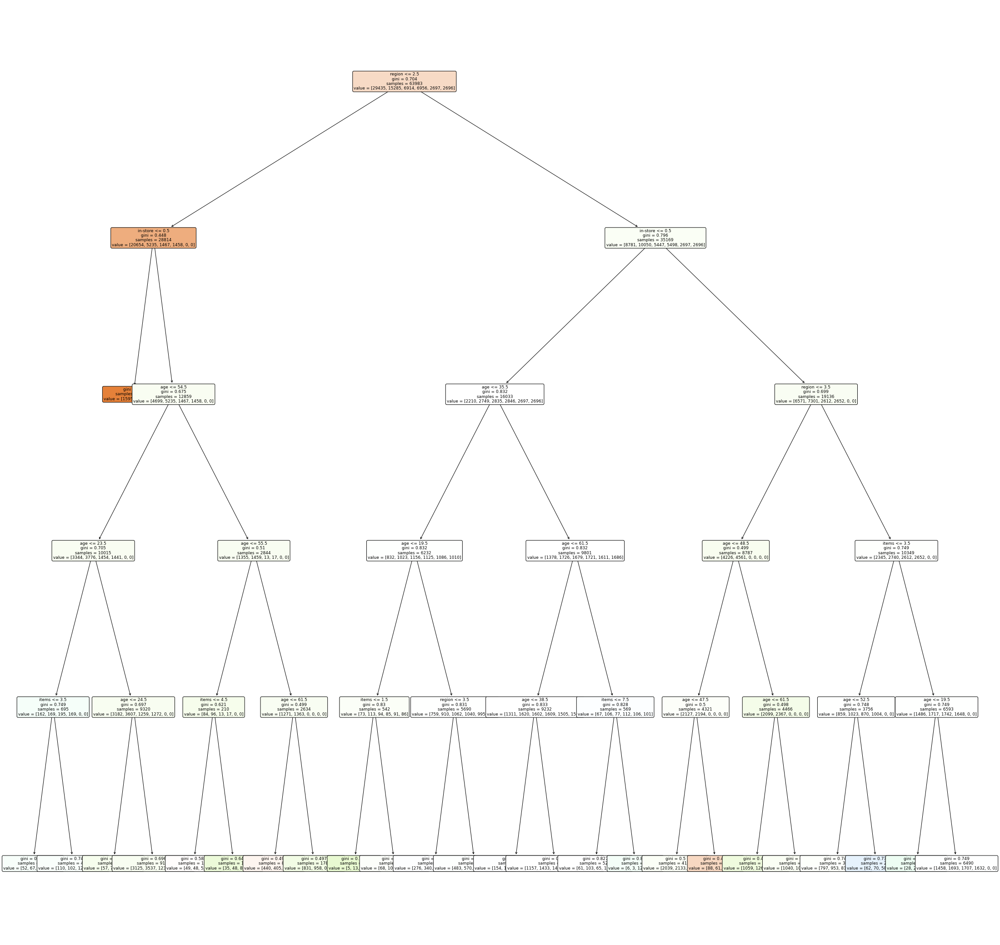

In [49]:
#the final model tree looks like
plt.figure(figsize=(38,38))
plot_tree(tree1,filled=1,rounded=1,feature_names=["in-store","items","region","age"],fontsize=9);
#plt.savefig("tree.jpg")